# Project 1: Data Clustering Analysis

## Basic description of analyzed dataset
Jedná se o syntetickou, ale realistickou kolekci dat, která má reprezentovat klíčové operační metriky a atributy různých druhů lodí operujících v Guinejském zálivu.

Dataset se skládá z 2736 řádků a 24 sloupců, s atributy buď číselných nebo kategorických typů. 
### Mezi hlavní atributy patří:

Číselné:
- **Speed_Over_Ground_knots:** Průměrná rychlost lodi po vodě (v uzlech)
- **Engine_Power_kW:** Výstupní výkon motoru (v kilowattech)
- **Distance_Traveled_nm:** Celková vzdálenost, kterou loď urazila (v námořních mílích)
- **Operational_Cost_USD:** Celkové provozní náklady na jednu plavbu (v amerických dolarech)
- **Revenue_per_Voyage_USD:** Příjem vygenerovaný za jednu plavbu (v amerických dolarech)
- **Efficiency_nm_per_kWh:** Energetická účinnost vyjádřená v námořních mílích na kilowatthodinu

Kategorické:
- **Ship_Type:** Typ lodi (např. tanker, kontejnerová loď, přepravník ryb, loď pro přepravu sypkého nákladu)
- **Route_Type:** Typ trasy plavby (např. krátká trasa, dlouhá trasa, transoceánská)
- **Engine_Type:** Typ motoru (např. dieselový, na těžké topné oleje)
- **Maintenance_Status:** Stav údržby lodi (např. přijatelný, kritický, dobrý)
- **Weather_Condition:** Převládající povětrnostní podmínky během plaveb (např. klidné, mírné, rozbouřené)


## EDA

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [11]:
df_full = pd.read_csv('datasets/Ship_Performance_Dataset.csv', sep=",")
df_full

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
0,2023-06-04,Container Ship,NaN,Heavy Fuel Oil (HFO),Critical,12.597558,2062.983982,1030.943616,14.132284,Moderate,1959.017882,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249
1,2023-06-11,Fish Carrier,Short-haul,Steam Turbine,Good,10.387580,1796.057415,1060.486382,14.653083,Rough,162.394712,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372
2,2023-06-18,Container Ship,Long-haul,Diesel,Fair,20.749747,1648.556685,658.874144,7.199261,Moderate,178.040917,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244
3,2023-06-25,Bulk Carrier,Transoceanic,Steam Turbine,Fair,21.055102,915.261795,1126.822519,11.789063,Moderate,1737.385346,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698
4,2023-07-02,Fish Carrier,Transoceanic,Diesel,Fair,13.742777,1089.721803,1445.281159,9.727833,Moderate,260.595103,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2731,2024-06-02,Tanker,Short-haul,Heavy Fuel Oil (HFO),Good,11.607997,2918.395972,239.990359,13.700906,Moderate,318.111891,237975.067292,731584.322921,47.152337,1.000265,1.284895,3,74.813114
2732,2024-06-09,Bulk Carrier,Short-haul,Heavy Fuel Oil (HFO),Good,13.852798,2161.282358,831.355653,14.612775,NaN,218.309002,21029.021721,374365.370930,64.325916,0.653474,0.891085,2,84.595155
2733,2024-06-16,Container Ship,Short-haul,Steam Turbine,Critical,16.813713,1343.608006,1376.460622,9.306518,NaN,1630.646419,78883.312529,234120.365052,53.551090,0.594169,0.725404,6,80.975269
2734,2024-06-23,Tanker,Transoceanic,Heavy Fuel Oil (HFO),Good,23.132643,2028.143572,619.236340,6.623856,Moderate,153.441965,25241.550250,799713.737211,14.335517,0.895670,0.902960,2,92.853622


In [6]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2736 entries, 0 to 2735
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Date                     2736 non-null   object 
 1   Ship_Type                2600 non-null   object 
 2   Route_Type               2600 non-null   object 
 3   Engine_Type              2600 non-null   object 
 4   Maintenance_Status       2600 non-null   object 
 5   Speed_Over_Ground_knots  2736 non-null   float64
 6   Engine_Power_kW          2736 non-null   float64
 7   Distance_Traveled_nm     2736 non-null   float64
 8   Draft_meters             2736 non-null   float64
 9   Weather_Condition        2600 non-null   object 
 10  Cargo_Weight_tons        2736 non-null   float64
 11  Operational_Cost_USD     2736 non-null   float64
 12  Revenue_per_Voyage_USD   2736 non-null   float64
 13  Turnaround_Time_hours    2736 non-null   float64
 14  Efficiency_nm_per_kWh   

In [7]:
df_full.describe()

,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
count,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000
mean,17.602863,1757.610939,1036.406203,9.929103,1032.573264,255143.344488,521362.062011,41.747536,0.798656,1.003816,4.914839,75.219222
std,4.311979,717.002777,568.632080,2.876423,558.697499,140890.482189,271211.625499,17.633130,0.403590,0.288251,2.597647,14.510168
min,10.009756,501.025220,50.433150,5.001947,50.229624,10092.306318,50351.814447,12.019909,0.100211,0.500004,1.000000,50.012005
25%,13.928452,1148.104914,548.511573,7.437485,553.983629,131293.378767,290346.388017,26.173537,0.463592,0.758033,3.000000,62.703724
50%,17.713757,1757.494344,1037.816060,9.918965,1043.207497,257157.653226,520176.931762,41.585188,0.789877,1.009009,5.000000,75.504709
75%,21.284785,2382.594292,1540.934161,12.413149,1527.722391,381796.930499,750072.791216,57.363922,1.147426,1.252808,7.000000,87.721205
max,24.997043,2998.734329,1998.337057,14.992947,1999.126697,499734.867868,999916.696140,71.972415,1.499259,1.499224,9.000000,99.999643


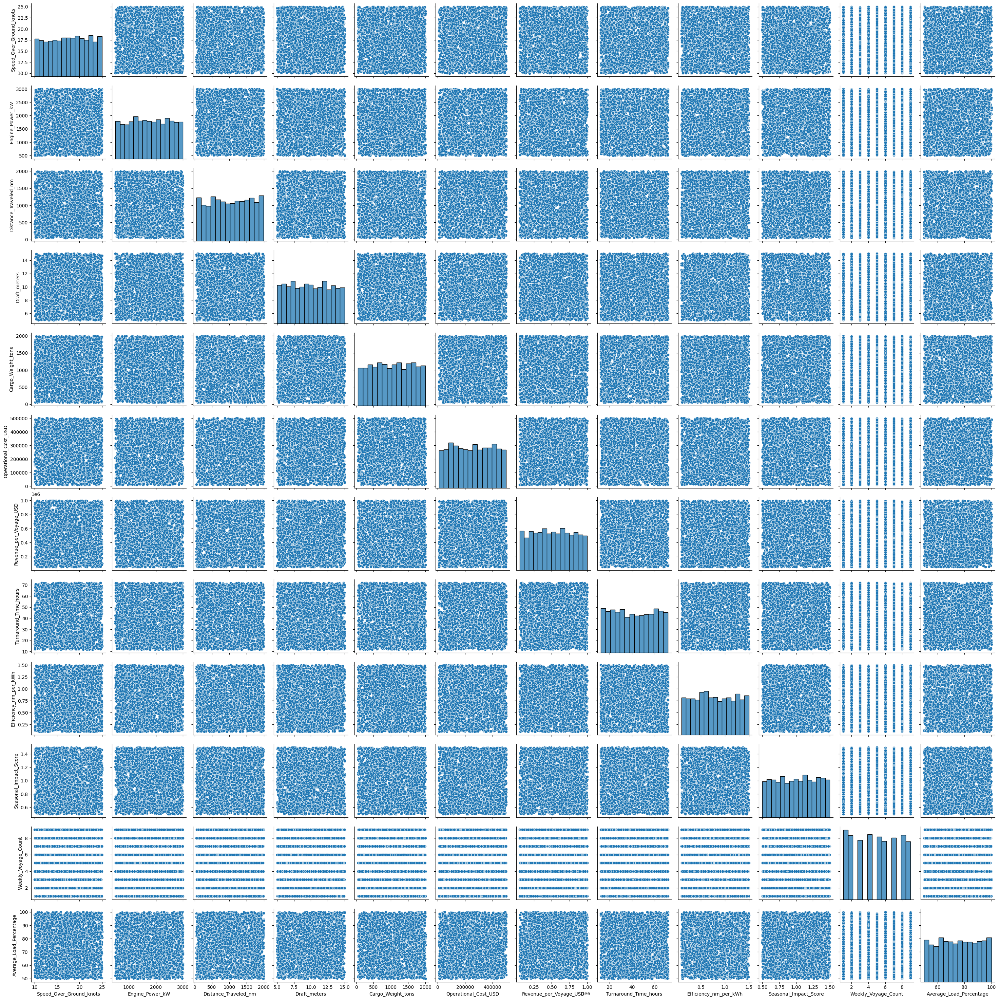

In [8]:
sns.pairplot(data=df_full)

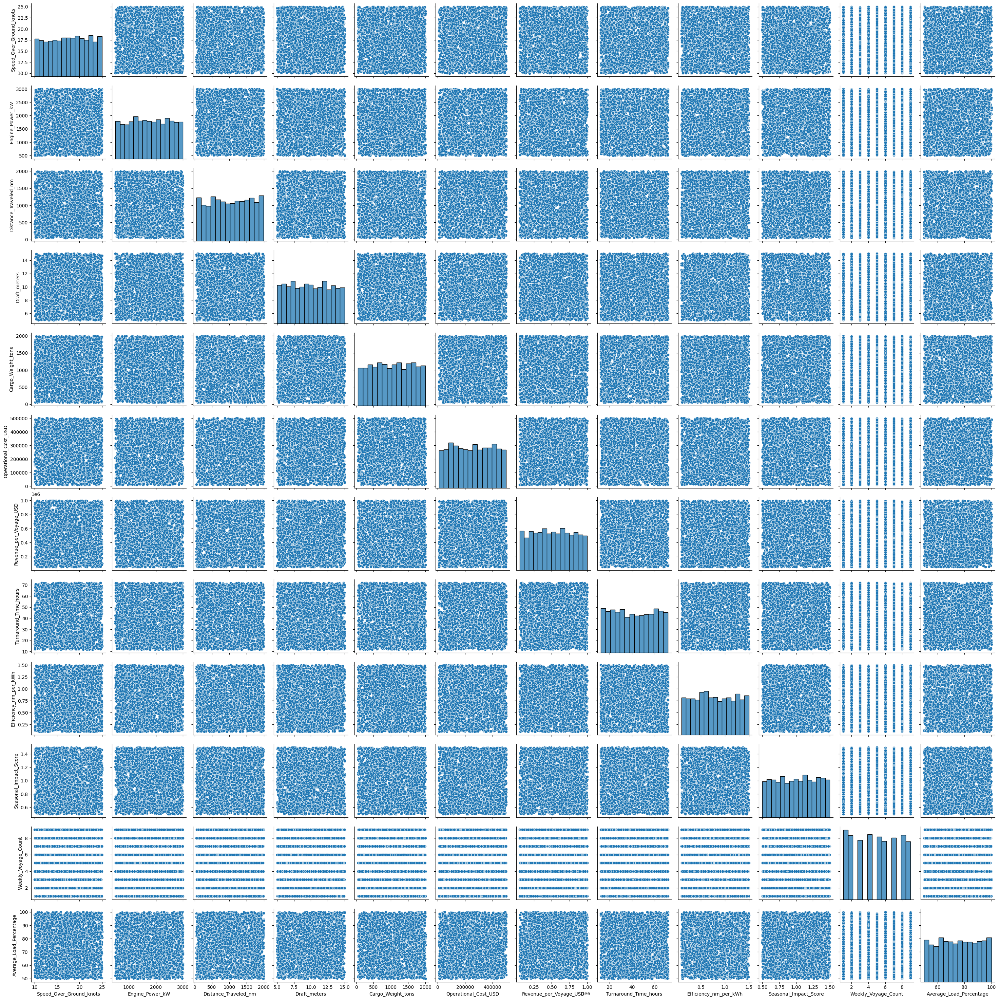

In [9]:
numerical_columns = ['Speed_Over_Ground_knots', 'Engine_Power_kW', 'Distance_Traveled_nm', 
                     'Draft_meters', 'Cargo_Weight_tons', 'Operational_Cost_USD', 
                     'Revenue_per_Voyage_USD', 'Turnaround_Time_hours', 'Efficiency_nm_per_kWh', 
                     'Seasonal_Impact_Score', 'Weekly_Voyage_Count', 'Average_Load_Percentage']
sns.pairplot(data=df_full, vars=numerical_columns)

Vidíme, že Weekly_Voyage_count je spíše kategorický atribut

In [14]:
df_full['Weekly_Voyage_Count_2'] = df_full.Weekly_Voyage_Count.astype(str)


In [18]:
df_full.head()

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage,Weekly_Voyage_Count_2
0,2023-06-04,Container Ship,MISSING,Heavy Fuel Oil (HFO),Critical,12.597558,2062.983982,1030.943616,14.132284,Moderate,1959.017882,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249,1
1,2023-06-11,Fish Carrier,Short-haul,Steam Turbine,Good,10.387580,1796.057415,1060.486382,14.653083,Rough,162.394712,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372,6
2,2023-06-18,Container Ship,Long-haul,Diesel,Fair,20.749747,1648.556685,658.874144,7.199261,Moderate,178.040917,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244,9
3,2023-06-25,Bulk Carrier,Transoceanic,Steam Turbine,Fair,21.055102,915.261795,1126.822519,11.789063,Moderate,1737.385346,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698,1
4,2023-07-02,Fish Carrier,Transoceanic,Diesel,Fair,13.742777,1089.721803,1445.281159,9.727833,Moderate,260.595103,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581,8


In [15]:
qualitative_columns = df_full.select_dtypes(exclude=np.number).columns
for c in qualitative_columns:
    if df_full[c].isnull().any:
        df_full[c]=df_full[c].fillna('MISSING')

In [16]:
for col in qualitative_columns:
    print(f"\n{col} value counts:")
    print(df_full[col].value_counts(normalize=True))


Date value counts:
Date
2023-06-04    0.017544
2023-12-24    0.017544
2024-01-07    0.017544
2024-01-14    0.017544
2024-01-21    0.017544
2024-01-28    0.017544
2024-02-04    0.017544
2024-02-11    0.017544
2024-02-18    0.017544
2024-02-25    0.017544
2024-03-03    0.017544
2024-03-10    0.017544
2024-03-17    0.017544
2024-03-24    0.017544
2024-03-31    0.017544
2024-04-07    0.017544
2024-04-14    0.017544
2024-04-21    0.017544
2024-04-28    0.017544
2024-05-05    0.017544
2024-05-12    0.017544
2024-05-19    0.017544
2024-05-26    0.017544
2024-06-02    0.017544
2024-06-09    0.017544
2024-06-16    0.017544
2024-06-23    0.017544
2023-12-31    0.017544
2023-12-17    0.017544
2023-06-11    0.017544
2023-12-10    0.017544
2023-06-18    0.017544
2023-06-25    0.017544
2023-07-02    0.017544
2023-07-09    0.017544
2023-07-16    0.017544
2023-07-23    0.017544
2023-07-30    0.017544
2023-08-06    0.017544
2023-08-13    0.017544
2023-08-20    0.017544
2023-08-27    0.017544
2023-09-0

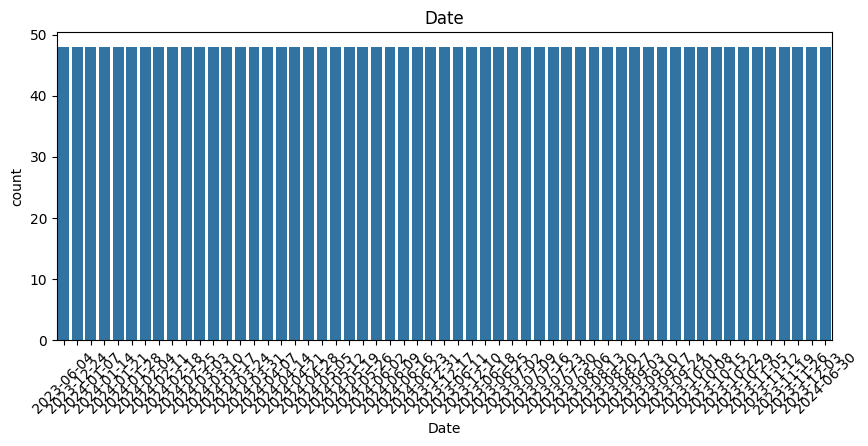

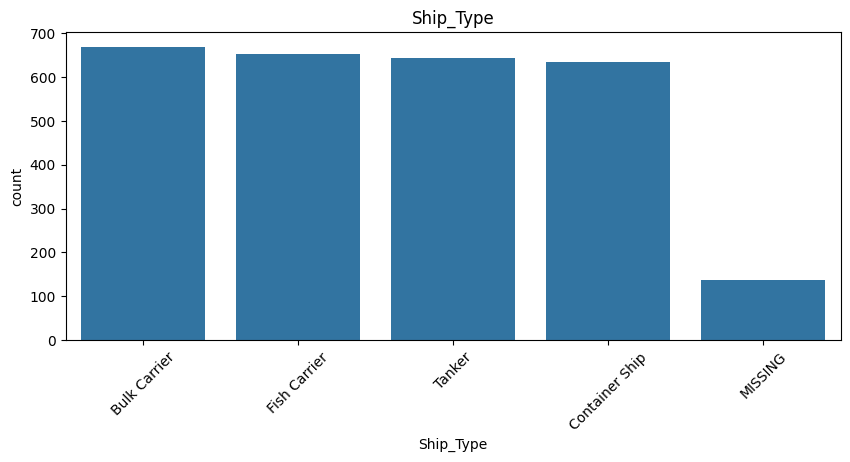

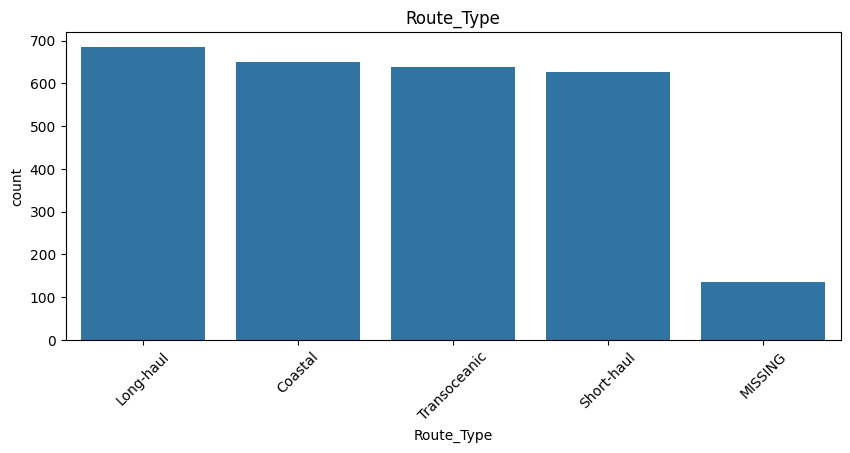

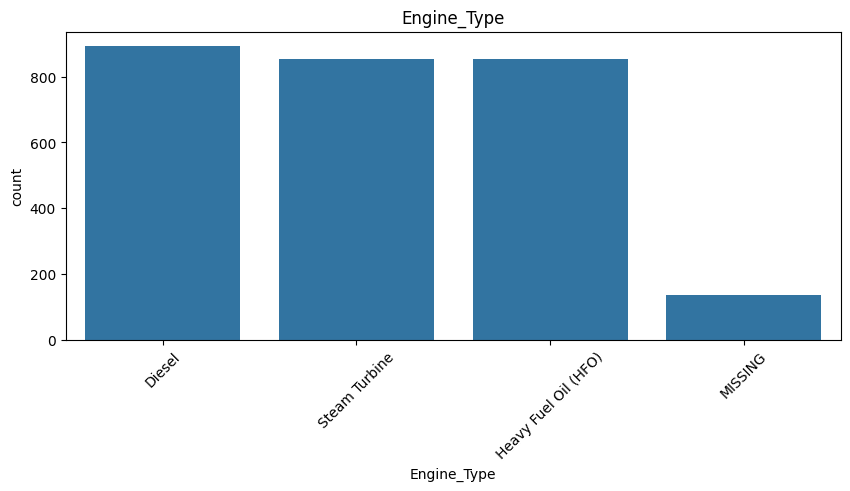

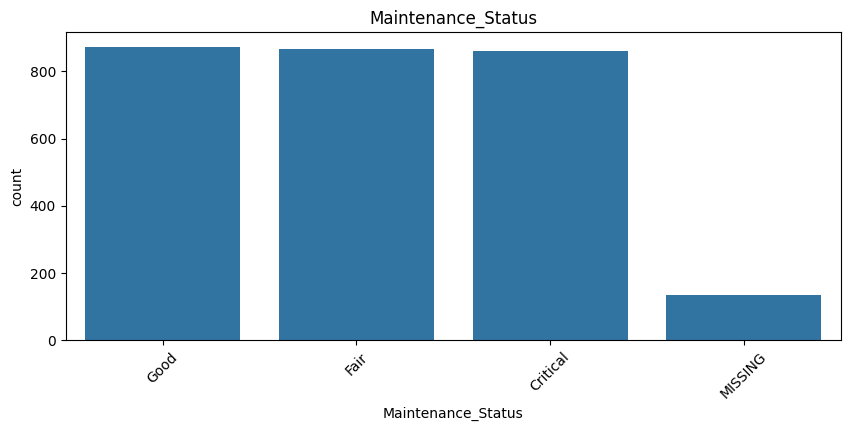

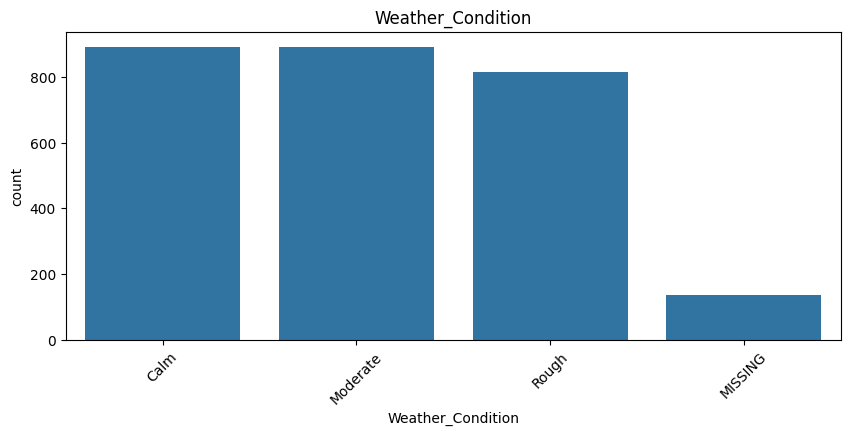

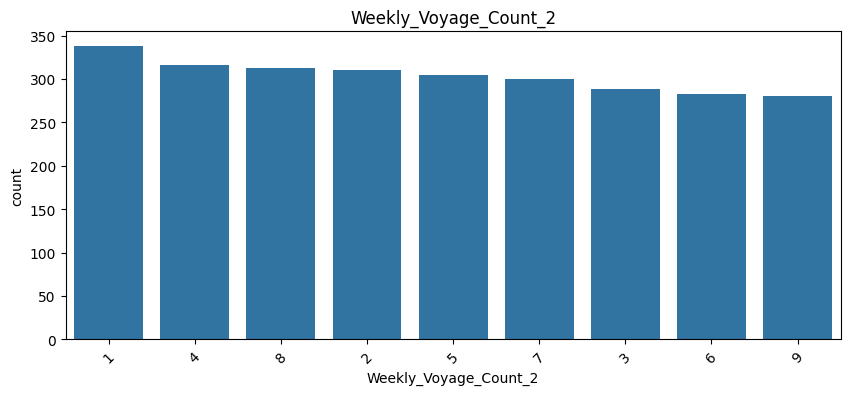

In [17]:
for col in qualitative_columns:
    plt.figure(figsize=(10,4))
    sns.countplot(data=df_full, x=col, order=df_full[col].value_counts().index)
    plt.xticks(rotation=45)
    plt.title(col)
    plt.show()

/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/2130615908.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_left.set_xticklabels(ax_left.xaxis.get_majorticklabels(), rotation=60)
/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/2130615908.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_right.set_xticklabels(ax_right.xaxis.get_majorticklabels(), rotation=60)
/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/2130615908.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_left.set_xticklabels(ax_left.xaxis.get_majorticklabels(), rotation=60)
/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/2130615908.py:10: UserWarning: set_ticklabels() should only be used with a fix

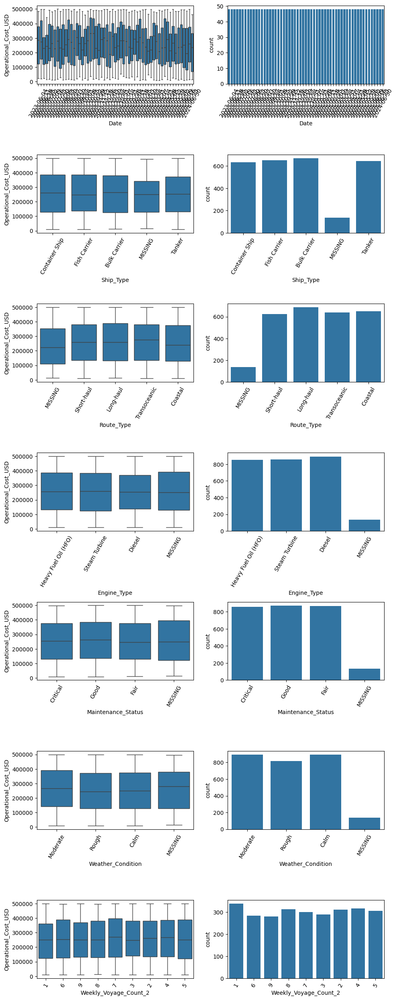

In [19]:
fig, axes = plt.subplots(len(qualitative_columns), 2, figsize=(10, 25))
df=df_full

for i, col in enumerate(qualitative_columns):
    ax_left = axes.flat[2*i]
    ax_right = axes.flat[2*i + 1]
    sns.boxplot(data=df, x=col, y='Operational_Cost_USD', ax=ax_left)
    ax_left.set_xticklabels(ax_left.xaxis.get_majorticklabels(), rotation=60)
    sns.countplot(data=df, x=col, ax=ax_right)
    ax_right.set_xticklabels(ax_right.xaxis.get_majorticklabels(), rotation=60)
        
fig.tight_layout()

/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/1282022857.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_left.set_xticklabels(ax_left.xaxis.get_majorticklabels(), rotation=60)
/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/1282022857.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_right.set_xticklabels(ax_right.xaxis.get_majorticklabels(), rotation=60)
/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/1282022857.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_left.set_xticklabels(ax_left.xaxis.get_majorticklabels(), rotation=60)
/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/1282022857.py:10: UserWarning: set_ticklabels() should only be used with a fix

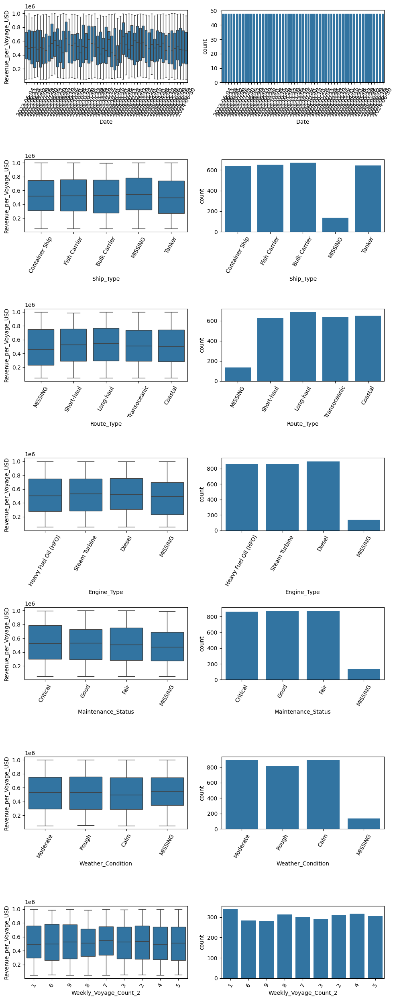

In [20]:
fig, axes = plt.subplots(len(qualitative_columns), 2, figsize=(10, 25))
df=df_full

for i, col in enumerate(qualitative_columns):
    ax_left = axes.flat[2*i]
    ax_right = axes.flat[2*i + 1]
    sns.boxplot(data=df, x=col, y='Revenue_per_Voyage_USD', ax=ax_left)
    ax_left.set_xticklabels(ax_left.xaxis.get_majorticklabels(), rotation=60)
    sns.countplot(data=df, x=col, ax=ax_right)
    ax_right.set_xticklabels(ax_right.xaxis.get_majorticklabels(), rotation=60)
        
fig.tight_layout()

In [21]:
selected_columns = [col for col in df.columns if col not in qualitative_columns]
corr_mat = df[selected_columns].corr()
corr_mat

,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
Speed_Over_Ground_knots,1.000000,-0.003299,-0.010198,-0.015117,-0.005009,-0.035825,0.002370,-0.005812,0.019273,0.028357,0.019171,-0.021861
Engine_Power_kW,-0.003299,1.000000,-0.009120,0.008133,-0.012654,-0.012260,-0.010947,-0.032442,-0.017918,-0.011767,0.036588,0.023847
Distance_Traveled_nm,-0.010198,-0.009120,1.000000,-0.010686,0.013680,0.002468,0.040388,-0.026672,0.003229,0.016989,0.044302,-0.005230
Draft_meters,-0.015117,0.008133,-0.010686,1.000000,0.006463,0.004111,0.000634,-0.029324,-0.017294,-0.001700,0.012634,-0.011336
Cargo_Weight_tons,-0.005009,-0.012654,0.013680,0.006463,1.000000,-0.036499,0.016556,-0.031743,0.006178,-0.026754,-0.001022,0.026690
Operational_Cost_USD,-0.035825,-0.012260,0.002468,0.004111,-0.036499,1.000000,0.023865,-0.003679,0.003258,0.021142,0.007967,-0.019514
Revenue_per_Voyage_USD,0.002370,-0.010947,0.040388,0.000634,0.016556,0.023865,1.000000,-0.026839,0.016669,0.019510,0.010842,0.008724
Turnaround_Time_hours,-0.005812,-0.032442,-0.026672,-0.029324,-0.031743,-0.003679,-0.026839,1.000000,0.009138,0.009526,-0.012483,0.019615
Efficiency_nm_per_kWh,0.019273,-0.017918,0.003229,-0.017294,0.006178,0.003258,0.016669,0.009138,1.000000,-0.005023,-0.004604,-0.010777
Seasonal_Impact_Score,0.028357,-0.011767,0.016989,-0.001700,-0.026754,0.021142,0.019510,0.009526,-0.005023,1.000000,0.007728,-0.031340


<Axes: >

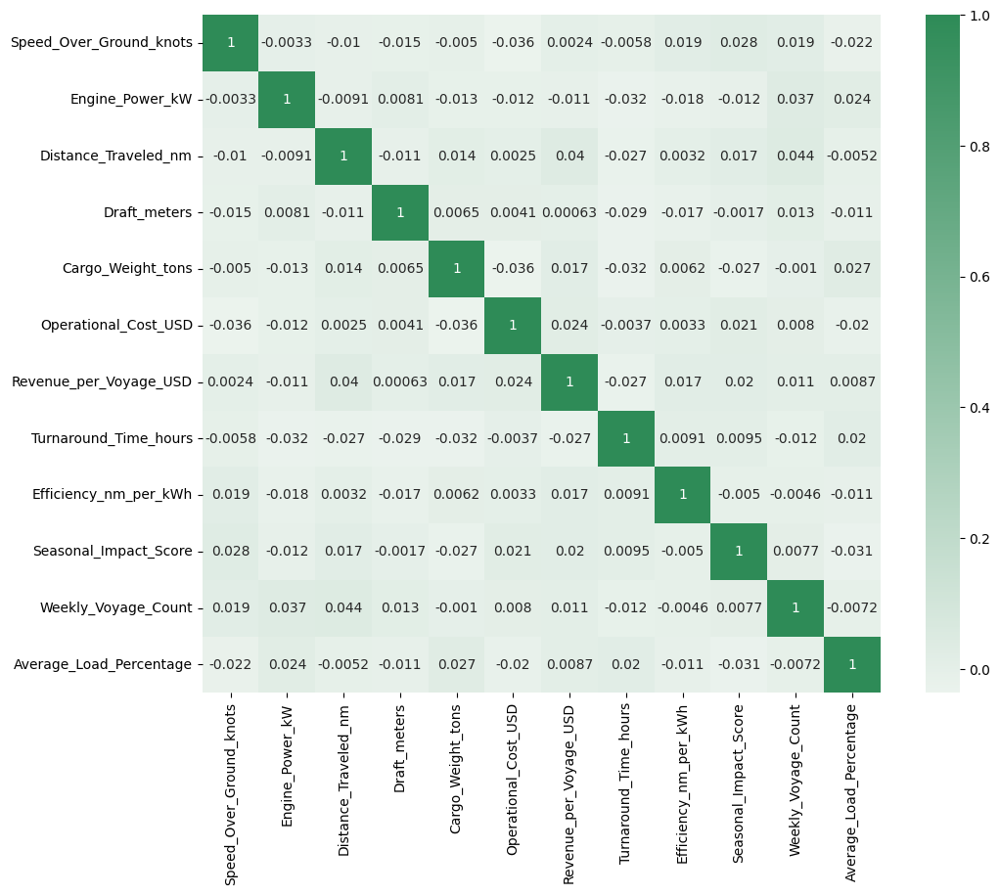

In [22]:
plt.figure(figsize=(12, 9))
sns.heatmap(corr_mat, cmap=sns.light_palette("seagreen", as_cmap=True), vmax=1, square=True, annot=True)

Po provedení EDA jsme neobjevil v datech žádné zajímavé trendy. Na datech je vidět, že náklady a zisk z provozu lodi se liší výrazně podle data.

## Data Preprocessing

Jelikož tam mámé asi 55 záznamů s datem, tak ho budeme muset zakodovat jinak, než přes dummy encoding. Použijeme časovou vzdálenost (převod na počet dní od začátku). 

In [13]:
#df=df_full
df['Date'] = pd.to_datetime(df['Date'])
df['DaysSinceStart'] = (df['Date'] - df['Date'].min()).dt.days

In [14]:
df.head(5)

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage,DaysSinceStart
0,2023-06-04,Container Ship,NaN,Heavy Fuel Oil (HFO),Critical,12.597558,2062.983982,1030.943616,14.132284,Moderate,1959.017882,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249,0
1,2023-06-11,Fish Carrier,Short-haul,Steam Turbine,Good,10.387580,1796.057415,1060.486382,14.653083,Rough,162.394712,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372,7
2,2023-06-18,Container Ship,Long-haul,Diesel,Fair,20.749747,1648.556685,658.874144,7.199261,Moderate,178.040917,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244,14
3,2023-06-25,Bulk Carrier,Transoceanic,Steam Turbine,Fair,21.055102,915.261795,1126.822519,11.789063,Moderate,1737.385346,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698,21
4,2023-07-02,Fish Carrier,Transoceanic,Diesel,Fair,13.742777,1089.721803,1445.281159,9.727833,Moderate,260.595103,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581,28


In [15]:
cat_cols = [col for col in df.select_dtypes(exclude='number').columns if col not in {'Date','Weekly_Voyage_Count_2'}]


In [16]:
df_clustering = df[cat_cols]

In [17]:
df_clustering.head(5)

,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Weather_Condition
0,Container Ship,NaN,Heavy Fuel Oil (HFO),Critical,Moderate
1,Fish Carrier,Short-haul,Steam Turbine,Good,Rough
2,Container Ship,Long-haul,Diesel,Fair,Moderate
3,Bulk Carrier,Transoceanic,Steam Turbine,Fair,Moderate
4,Fish Carrier,Transoceanic,Diesel,Fair,Moderate


In [18]:
df_encoded = pd.get_dummies(df[cat_cols])
df_encoded.head()

,Ship_Type_Bulk Carrier,Ship_Type_Container Ship,Ship_Type_Fish Carrier,Ship_Type_Tanker,Route_Type_Coastal,Route_Type_Long-haul,Route_Type_Short-haul,Route_Type_Transoceanic,Engine_Type_Diesel,Engine_Type_Heavy Fuel Oil (HFO),Engine_Type_Steam Turbine,Maintenance_Status_Critical,Maintenance_Status_Fair,Maintenance_Status_Good,Weather_Condition_Calm,Weather_Condition_Moderate,Weather_Condition_Rough
0,False,True,False,False,False,False,False,False,False,True,False,True,False,False,False,True,False
1,False,False,True,False,False,False,True,False,False,False,True,False,False,True,False,False,True
2,False,True,False,False,False,True,False,False,True,False,False,False,True,False,False,True,False
3,True,False,False,False,False,False,False,True,False,False,True,False,True,False,False,True,False
4,False,False,True,False,False,False,False,True,True,False,False,False,True,False,False,True,False


In [19]:
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
numeric_columns = numeric_columns.difference(df_encoded.columns)
numeric_columns

Index(['Average_Load_Percentage', 'Cargo_Weight_tons', 'DaysSinceStart',
       'Distance_Traveled_nm', 'Draft_meters', 'Efficiency_nm_per_kWh',
       'Engine_Power_kW', 'Operational_Cost_USD', 'Revenue_per_Voyage_USD',
       'Seasonal_Impact_Score', 'Speed_Over_Ground_knots',
       'Turnaround_Time_hours', 'Weekly_Voyage_Count'],
      dtype='object')

In [20]:
from sklearn.preprocessing import MinMaxScaler

In [21]:
scaler = MinMaxScaler()
scaled_numeric_data = scaler.fit_transform(df[numeric_columns])
scaled_numeric_df = pd.DataFrame(scaled_numeric_data, columns=numeric_columns)

In [22]:
df_encoded = df_encoded.join(scaled_numeric_df)


In [23]:
df_encoded.head()

,Ship_Type_Bulk Carrier,Ship_Type_Container Ship,Ship_Type_Fish Carrier,Ship_Type_Tanker,Route_Type_Coastal,Route_Type_Long-haul,Route_Type_Short-haul,Route_Type_Transoceanic,Engine_Type_Diesel,Engine_Type_Heavy Fuel Oil (HFO),...,Distance_Traveled_nm,Draft_meters,Efficiency_nm_per_kWh,Engine_Power_kW,Operational_Cost_USD,Revenue_per_Voyage_USD,Seasonal_Impact_Score,Speed_Over_Ground_knots,Turnaround_Time_hours,Weekly_Voyage_Count
0,False,True,False,False,False,False,False,False,False,True,...,0.503367,0.913856,0.968493,0.625357,0.967522,0.254676,0.916364,0.172666,0.230969,0.000
1,False,False,True,False,False,False,True,False,False,False,...,0.518533,0.965983,0.135914,0.518488,0.966615,0.877680,0.385945,0.025210,0.854481,0.625
2,False,True,False,False,False,True,False,False,True,False,...,0.312357,0.219929,0.285468,0.459434,0.895451,0.361920,0.906517,0.716607,0.623798,1.000
3,True,False,False,False,False,False,False,True,False,False,...,0.552589,0.679323,0.430789,0.165847,0.513144,0.039175,0.871380,0.736981,0.173291,0.000
4,False,False,True,False,False,False,False,True,True,False,...,0.716076,0.473014,0.879978,0.235695,0.566997,0.659007,0.083444,0.249079,0.869660,0.875


In [24]:
df_encoded.shape

(2736, 30)

Provedl jsem data preprocessing pomocí minmax scaleru pro číselné hodnoty a dummy encoding pro kategorické hodnoty.

## Application of clustering methods

### Poznámka: 
Jelikož se všechny grafy číselných atributů a některé grafy kategorických atributů ukázaly jako nepodstatné, tak jsem se rozhodl nedělat popis grafů přímo pod nimi, ale na konci dané shlukovací metody jsem vždy popsal podstatné informace, které jsme si z grafů odnesli. Zároveň bych rád poznamenal, že čísluju v textu klastry od 1, takže je potřeba na to brát zřetel, když se budete dívat na grafy, které jsou číslovány od 0.

### K Means

In [40]:
import sklearn
from sklearn.decomposition import PCA
import copy
from sklearn.manifold import TSNE

In [83]:
X = copy.deepcopy(df_encoded)

In [274]:
X_df = df

In [84]:
clustering_scores = []
for k in range(2, 11):
    clustering = sklearn.cluster.KMeans(n_clusters=k, random_state=13).fit(X)
    clustering_scores.append({
        'k': k,
        'sse': clustering.inertia_,
        'silhouette': sklearn.metrics.silhouette_score(X, clustering.labels_)
    })
df_clustering_scores = pd.DataFrame.from_dict(clustering_scores, orient='columns')
df_clustering_scores = df_clustering_scores.set_index('k')

In [85]:
df_clustering_scores

,sse,silhouette
k,,
2,12112.231764,0.066074
3,11517.528942,0.070559
4,10963.754237,0.081426
5,10953.134411,0.057093
6,10589.390036,0.065576
7,10111.263177,0.082300
8,10001.718889,0.076455
9,9899.264447,0.072137
10,9539.101396,0.092138


<Axes: xlabel='k', ylabel='sse'>

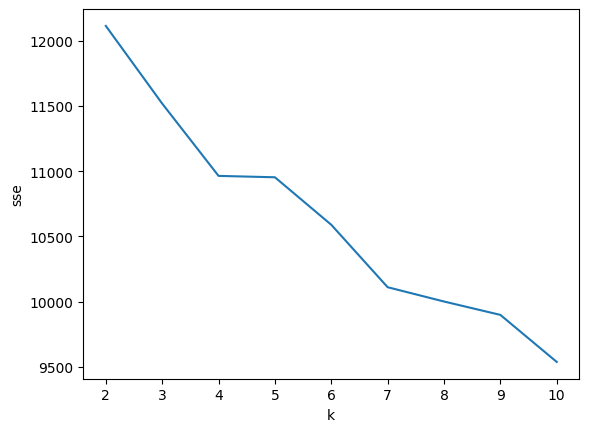

In [86]:
sns.lineplot(data = df_clustering_scores, y='sse', x='k')

<Axes: xlabel='k', ylabel='silhouette'>

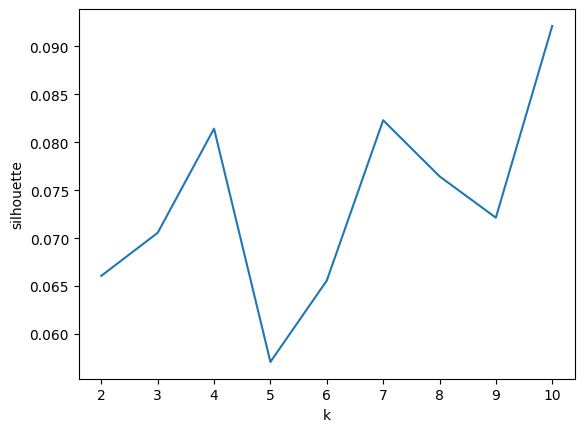

In [87]:
sns.lineplot(data = df_clustering_scores, y='silhouette', x='k')

In [88]:
clustering = sklearn.cluster.KMeans(n_clusters=4, random_state=13)
clustering.fit(X)

,n_clusters,4
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,13
,copy_x,True
,algorithm,'lloyd'


In [89]:
pd.Series(clustering.labels_).value_counts()

1    867
3    641
0    619
2    609
Name: count, dtype: int64

In [276]:
X['cluster_id'] = clustering.labels_
X.head()

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,...,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage,Weekly_Voyage_Count_2,DaysSinceStart,cluster_id
0,2023-06-04,Container Ship,MISSING,Heavy Fuel Oil (HFO),Critical,12.597558,2062.983982,1030.943616,14.132284,Moderate,...,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249,1,0,3
1,2023-06-11,Fish Carrier,Short-haul,Steam Turbine,Good,10.387580,1796.057415,1060.486382,14.653083,Rough,...,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372,6,7,2
2,2023-06-18,Container Ship,Long-haul,Diesel,Fair,20.749747,1648.556685,658.874144,7.199261,Moderate,...,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244,9,14,1
3,2023-06-25,Bulk Carrier,Transoceanic,Steam Turbine,Fair,21.055102,915.261795,1126.822519,11.789063,Moderate,...,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698,1,21,1
4,2023-07-02,Fish Carrier,Transoceanic,Diesel,Fair,13.742777,1089.721803,1445.281159,9.727833,Moderate,...,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581,8,28,1


In [278]:
tsne = TSNE(n_components=2, perplexity=30, random_state=13)
X_tsne = tsne.fit_transform(X)

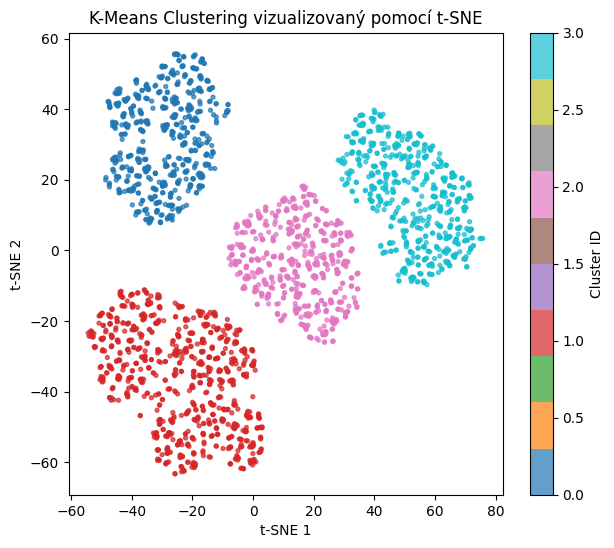

In [92]:
plt.figure(figsize=(7,6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=X['cluster_id'], cmap='tab10', s=8, alpha=0.7)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title("K-Means Clustering vizualizovaný pomocí t-SNE")
plt.colorbar(label="Cluster ID")
plt.show()

In [279]:
X_df['cluster_id'] = clustering.labels_

<Axes: xlabel='cluster_id', ylabel='count'>

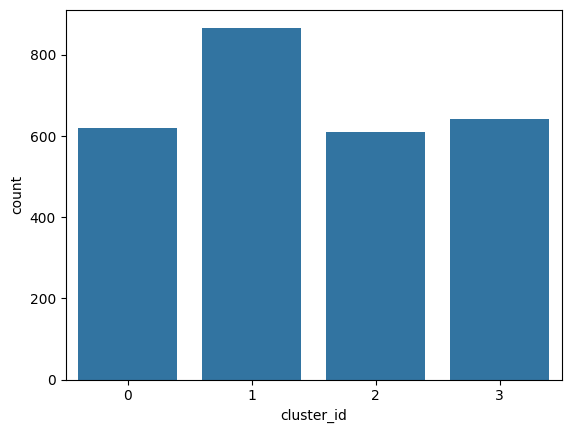

In [281]:
sns.countplot(data=X_df, x='cluster_id')

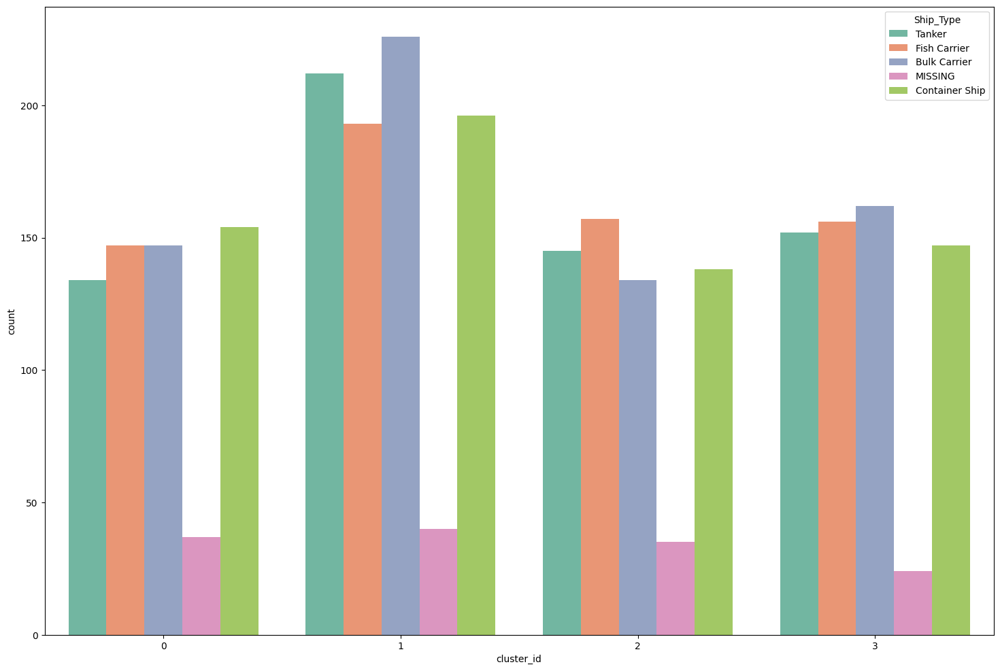

In [282]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_df,
    x='cluster_id',
    hue='Ship_Type',
    palette='Set2'
)
plt.legend(title='Ship_Type', loc='upper right')
plt.show()

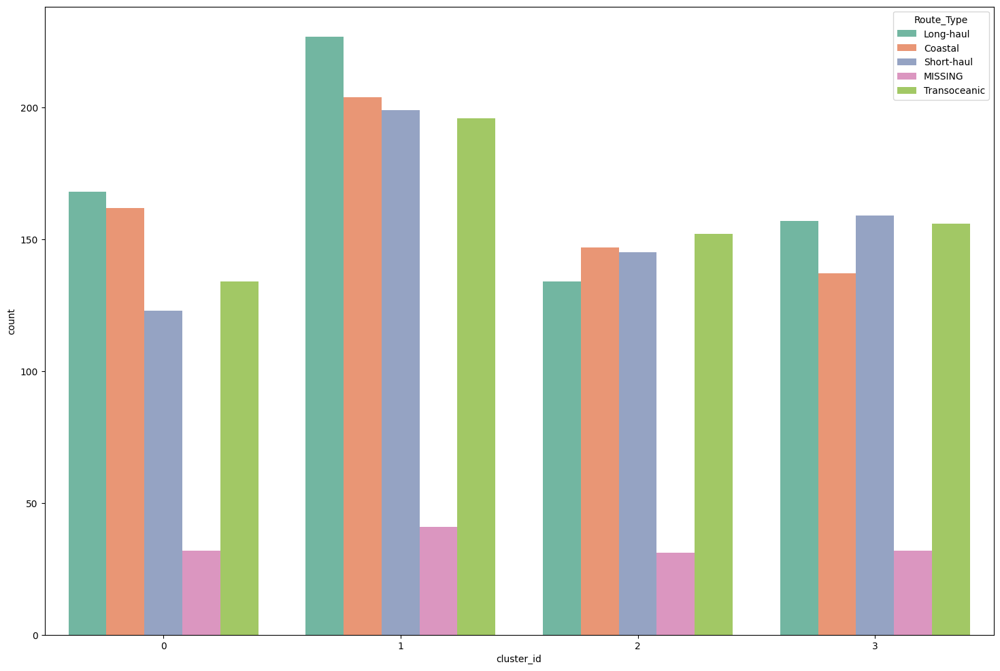

In [283]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_df,
    x='cluster_id',
    hue='Route_Type',
    palette='Set2'
)
plt.legend(title='Route_Type', loc='upper right')
plt.show()

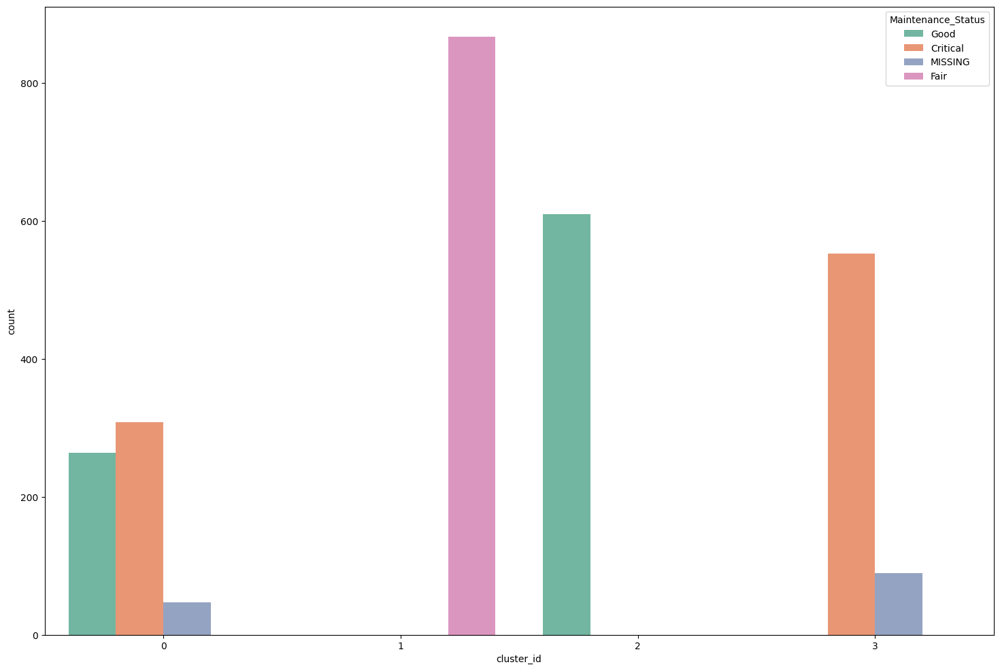

In [285]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_df,
    x='cluster_id',
    hue='Maintenance_Status',
    palette='Set2'
)
plt.legend(title='Maintenance_Status', loc='upper right')
plt.show()

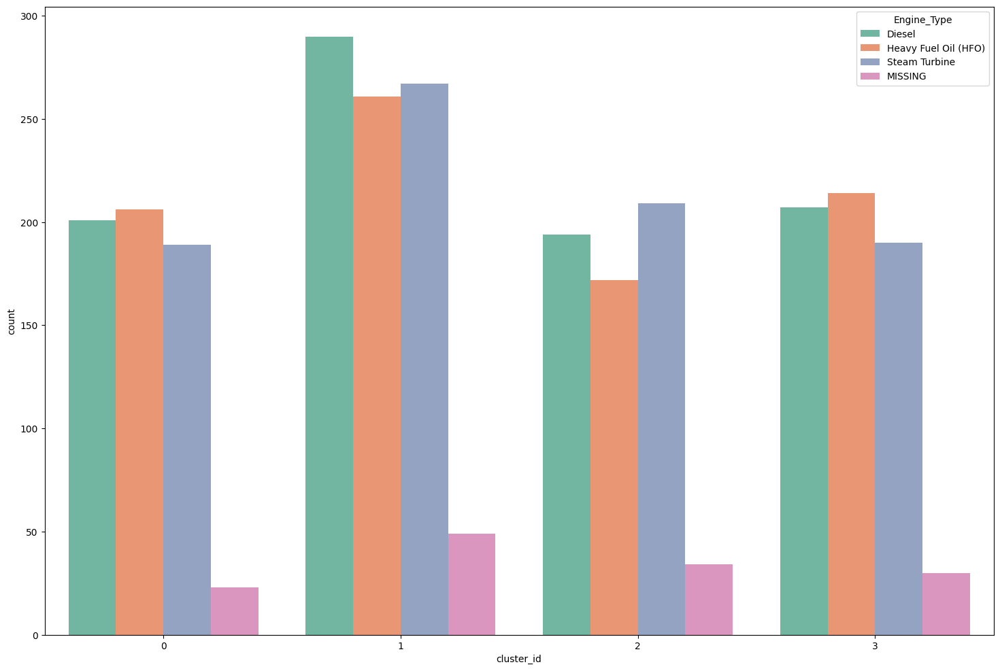

In [286]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_df,
    x='cluster_id',
    hue='Engine_Type',
    palette='Set2'
)
plt.legend(title='Engine_Type', loc='upper right')
plt.show()

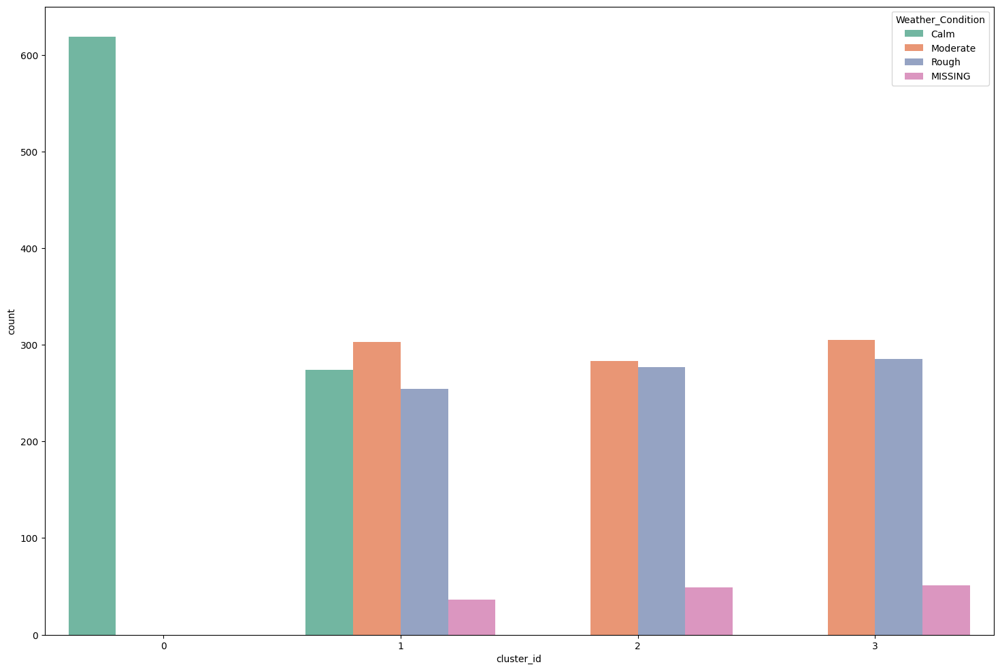

In [288]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_df,
    x='cluster_id',
    hue='Weather_Condition',
    palette='Set2'
)
plt.legend(title='Weather_Condition', loc='upper right')
plt.show()

In [51]:
def plot_my_graphs(name_of_column, name_of_graph=None):
    name = name_of_column
    
    if name_of_graph is not None:
        name2 = name_of_graph
    else:
        name2 = name

    
    plt.figure(figsize=(15, 5))
    plt.suptitle(name2.upper(), fontsize=16)

    plt.subplot(1, 3, 1) 
    sns.boxplot(data=X_df, y=name, x='cluster_id')
    plt.yscale('log')
    plt.title("Boxplot")

    plt.subplot(1, 3, 2)  
    sns.scatterplot(data=X_df, x='cluster_id', y=name)
    plt.title("Scatter Plot")

    plt.subplot(1, 3, 3)  
    sns.violinplot(data=X_df, x='cluster_id', y=name)
    plt.title("Violin Plot")

    plt.tight_layout() 
    plt.show()

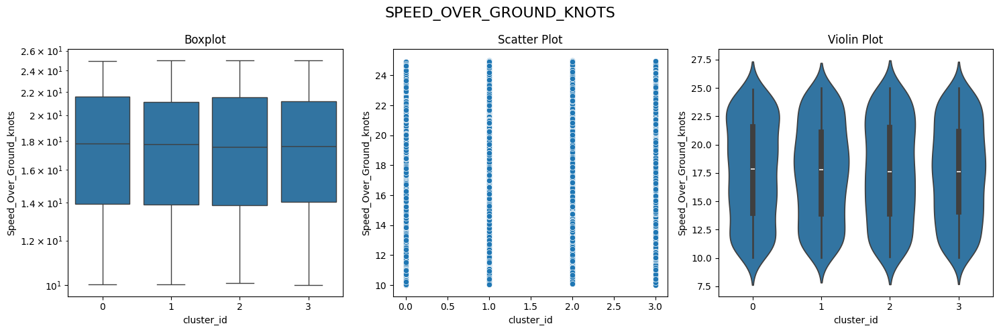

In [291]:
plot_my_graphs("Speed_Over_Ground_knots")

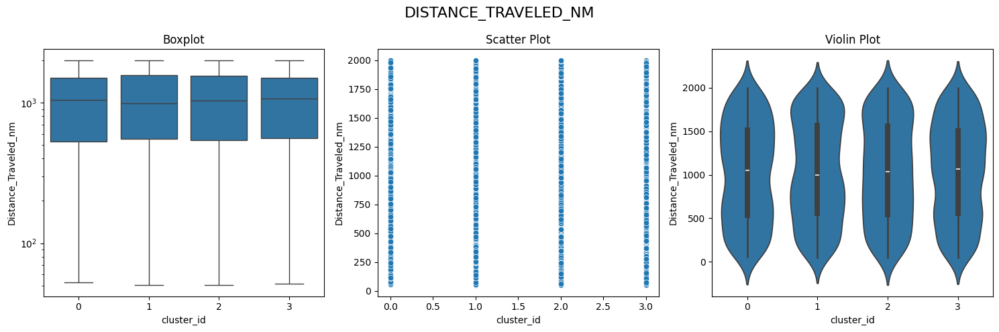

In [292]:
plot_my_graphs("Distance_Traveled_nm")

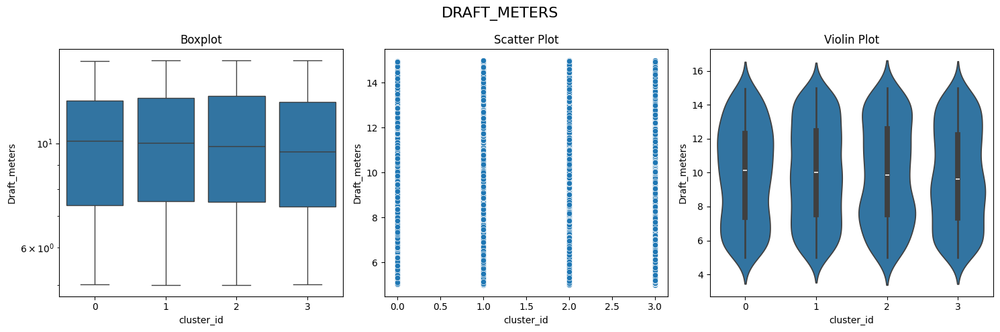

In [293]:
plot_my_graphs("Draft_meters")

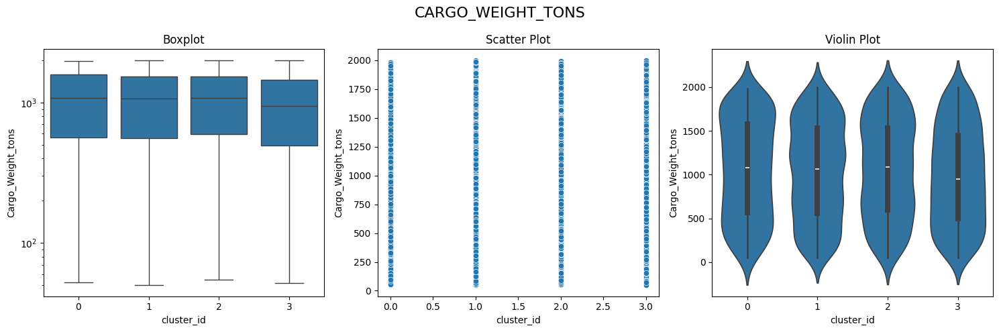

In [294]:
plot_my_graphs("Cargo_Weight_tons")

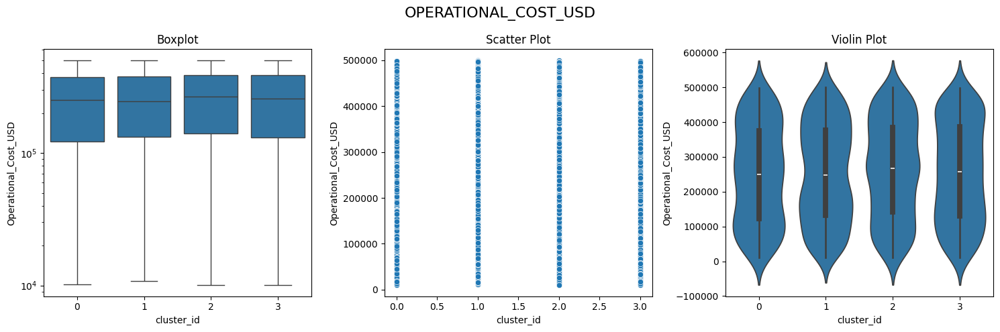

In [295]:
plot_my_graphs("Operational_Cost_USD")

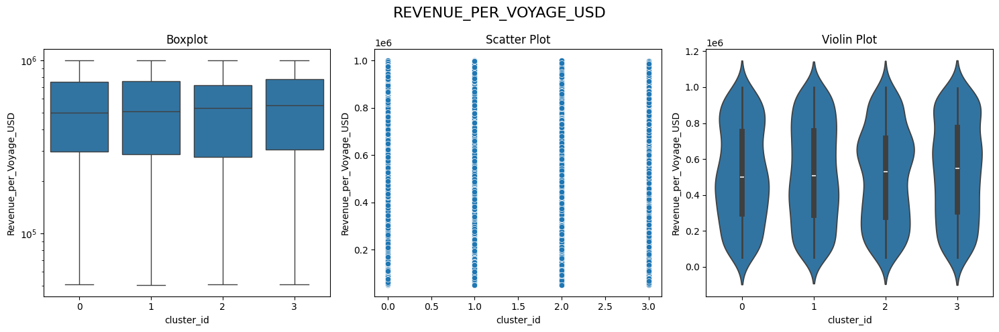

In [296]:
plot_my_graphs("Revenue_per_Voyage_USD")

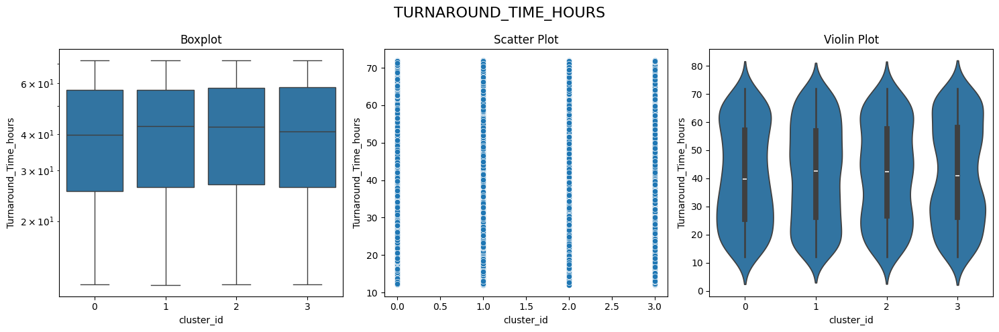

In [297]:
plot_my_graphs("Turnaround_Time_hours")

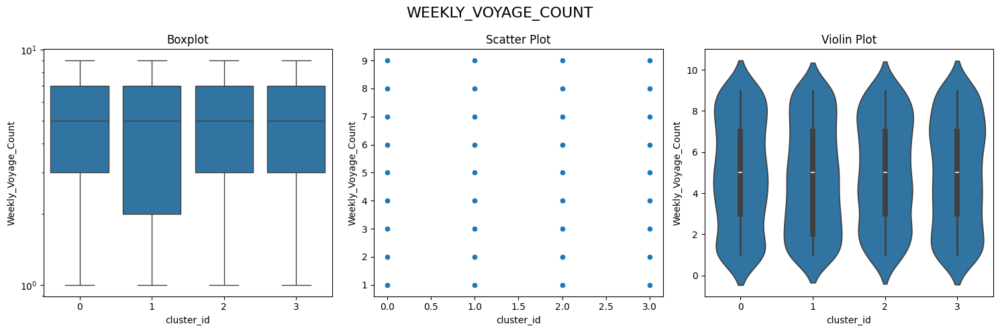

In [300]:
plot_my_graphs("Weekly_Voyage_Count")

Na úvod bych rád předestřel, že že čísluju v textu klastry od 1, takže je potřeba na to brát zřetel, když se budete dívat na grafy, které jsou číslovány od 0.

Pomocí siluety a sse jsem vybral 4 klastry. Když jsem si je vizualizoval pomocí t SNE, tak jde vidět, že jednotlové klastry jsou od sebe separovány. 

Jednotlivé klastry se od sebe v moc parametrech neliší. jsou odlišné ve velikosti, kdy je druhý klastr větší o 30 %. 
U rozdělení podle druhu lodi nedivíme žádné podstatné rozdíly. U typu trasy a pohonu je to stejné.
Hlavní rozdíly jsou u stavu lodi, kdy v prvním klastru máme kombinaci kritického a dobrého stavu. U druhého máme  všechny lodě v přijatelném stavu. Třetí je pouze v dobrém stavu a čtvrtý je zase převážně v kritickém stavu. 
Další rozdíly jsou v počasí, které bylo převážně během plavby. U prvního klastru to bylo klidné počasí, u druhého je to mix všech tří (klidné, mírné a drsné), třetí klastr je kombinací mírného a drsného počasí, stejně tak je to u čtvrtého.
Všechny číselné atributy jsou rozloženy rovnoměrně a neposkytují nám možnosti podrobněji pposat klastry.

Shrnutí klastrů, které jsem našel pomocí K means je následující:  <br>
První klastr je průměrné velikosti (600), jsou v něm lodě v kritickém a dobrém stavu a po dobu jejich plavby bylo převážné klidné počasí.
Druhý klastr je největší (800), sestává z lodí v přijatelném stavu, které pluli ve všech typech počasí. 
Třetí klastr je průměrné velikosti (600), jsou v něm lodě v dobrém stavu, které pluly v mírném a drsném počasí.
Čtvrtý klastr je průměrné velikosti (600), jsou v něm lodě v kritickém stavu, které pluly v mírném a drsném počasí.

Celkově lze říct, že metoda K-Means poskytla poměrně stabilní a dobře interpretovatelné rozdělení dat. Klastry jsou v prostoru t-SNE zřetelněji separovány než u aglomerativního shlukování, což naznačuje, že tato metoda dokázala lépe zachytit základní strukturu dat.
Jednotlivé skupiny se mezi sebou příliš neliší v technických nebo provozních parametrech, avšak určité vzorce lze pozorovat zejména v technickém stavu lodí a povětrnostních podmínkách během plavby.
Metoda odhalila čtyři hlavní typy lodí:

lodě v kritickém či dobrém stavu při klidném počasí,

lodě v přijatelném stavu při různorodých povětrnostních podmínkách,

lodě v dobrém stavu vystavené mírnému a drsnému počasí,

a lodě v kritickém stavu za mírných až drsných podmínek.

I když se číselné atributy mezi klastry výrazně neliší, výsledky ukazují, že kombinace stavu plavidla a povětrnostních faktorů představuje klíčové rozlišovací znaky mezi skupinami. Metoda K-Means tak umožnila identifikovat několik významných profilů lodí podle jejich stavu a podmínek, za kterých obvykle operují.

### Hierarchické shlukování

In [93]:
from scipy.spatial import distance_matrix
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import fcluster

In [94]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram
    # Credit to https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    plt.title('Hierarchical Clustering Dendrogram')
    dendrogram(linkage_matrix, **kwargs)
    plt.ylabel('distance')

In [95]:
X_agglomerative = copy.deepcopy(df_encoded)
X_agglomerative_df = df

In [301]:
X_agglomerative_df = df

In [119]:
clustering_agglomerative = AgglomerativeClustering(linkage='ward', distance_threshold=0, n_clusters=None,  compute_distances=True).fit(X_agglomerative)

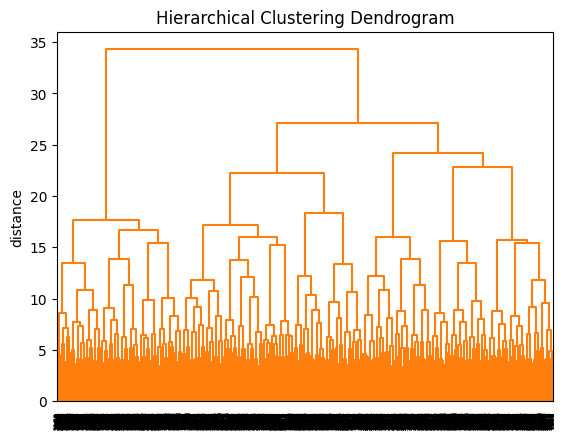

In [120]:
plot_dendrogram(clustering_agglomerative, labels=clustering_agglomerative.labels_, color_threshold=999)

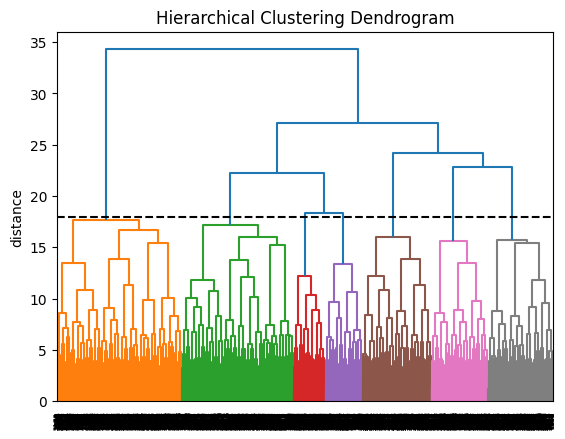

In [202]:
plot_dendrogram(clustering_agglomerative, labels=clustering_agglomerative.labels_, color_threshold=18.00)
plt.axhline(y=18.00, color='black', linestyle='--')

In [203]:
tsne_agglomerative = TSNE(n_components=2, perplexity=30, random_state=13)
X_tsne_agglomerative = tsne_agglomerative.fit_transform(X_agglomerative)

In [204]:
def sklearn_to_linkage(model):
    n_samples = len(model.labels_)
    counts = np.zeros(model.children_.shape[0])
    for i, (left, right) in enumerate(model.children_):
        c = (1 if left  < n_samples else counts[left  - n_samples]) + \
            (1 if right < n_samples else counts[right - n_samples])
        counts[i] = c
    Z = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    return Z

Z = sklearn_to_linkage(clustering_agglomerative)

In [306]:
labels = fcluster(Z, t=18.00, criterion='distance') - 1   # na 0-based


/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/1737542736.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = ListedColormap(plt.cm.get_cmap('tab20', k)(np.arange(k)))


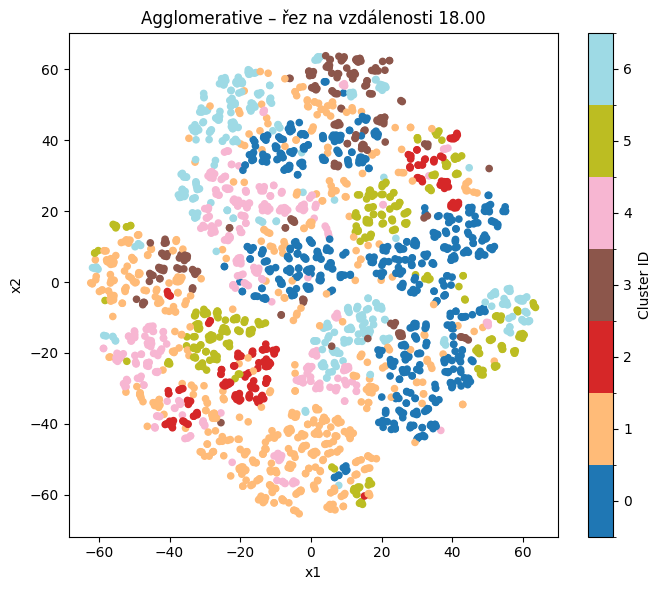

In [209]:
from matplotlib.colors import ListedColormap, BoundaryNorm

clusters = np.sort(np.unique(labels))
k = len(clusters)

lab2idx = {lab: i for i, lab in enumerate(clusters)}
c_idx = np.vectorize(lab2idx.get)(labels)   

cmap = ListedColormap(plt.cm.get_cmap('tab20', k)(np.arange(k)))
bounds = np.arange(-0.5, k + 0.5, 1)        # hranice mezi indexy
norm   = BoundaryNorm(bounds, cmap.N)

fig, ax = plt.subplots(figsize=(7,6))
sc = ax.scatter(X_tsne_agglomerative[:, 0], X_tsne_agglomerative[:, 1],
                c=c_idx, cmap=cmap, norm=norm, s=20)
ax.set_title('Agglomerative – řez na vzdálenosti 18.00')
ax.set_xlabel('x1'); ax.set_ylabel('x2')

cb = plt.colorbar(sc, ax=ax, ticks=np.arange(k))
cb.ax.set_yticklabels([str(l) for l in clusters])
cb.set_label("Cluster ID")

plt.tight_layout()
plt.show()

In [307]:
X_agglomerative_df['cluster_id'] = labels

<Axes: xlabel='cluster_id', ylabel='count'>

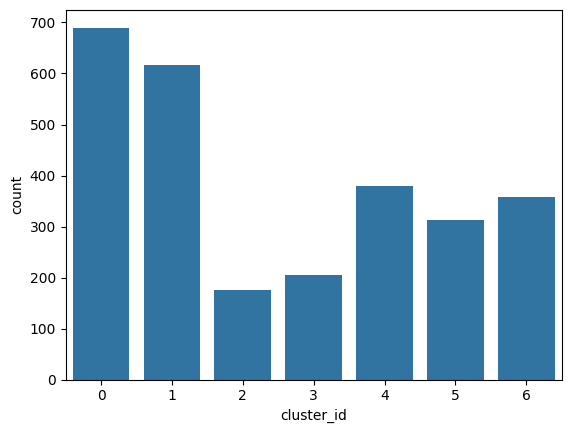

In [308]:
sns.countplot(data=X_agglomerative_df, x='cluster_id')

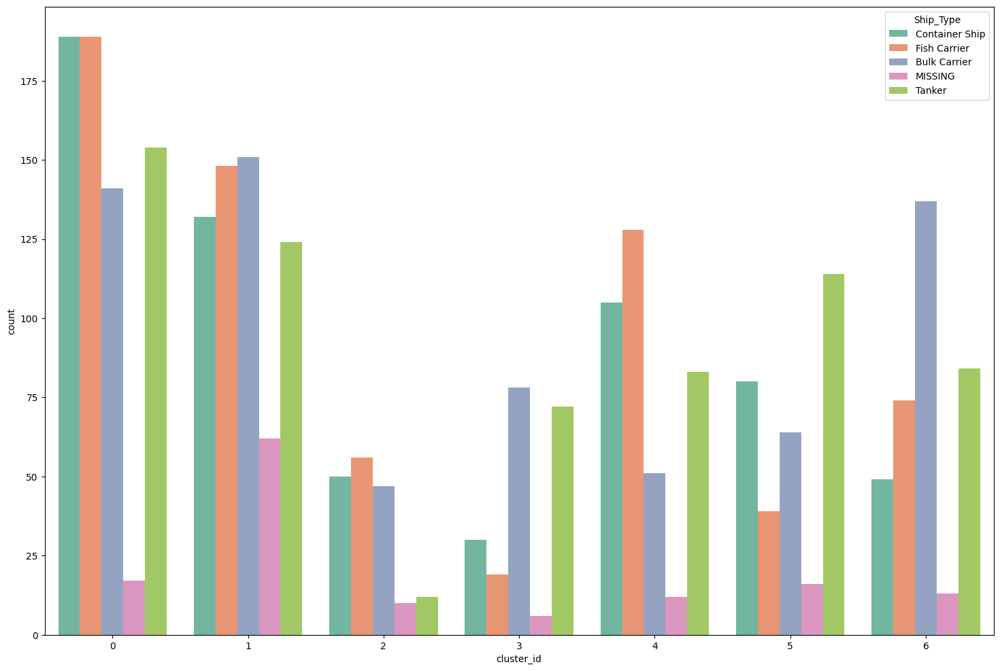

In [309]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_agglomerative_df,
    x='cluster_id',
    hue='Ship_Type',
    palette='Set2'
)
plt.legend(title='Ship_Type', loc='upper right')
plt.show()

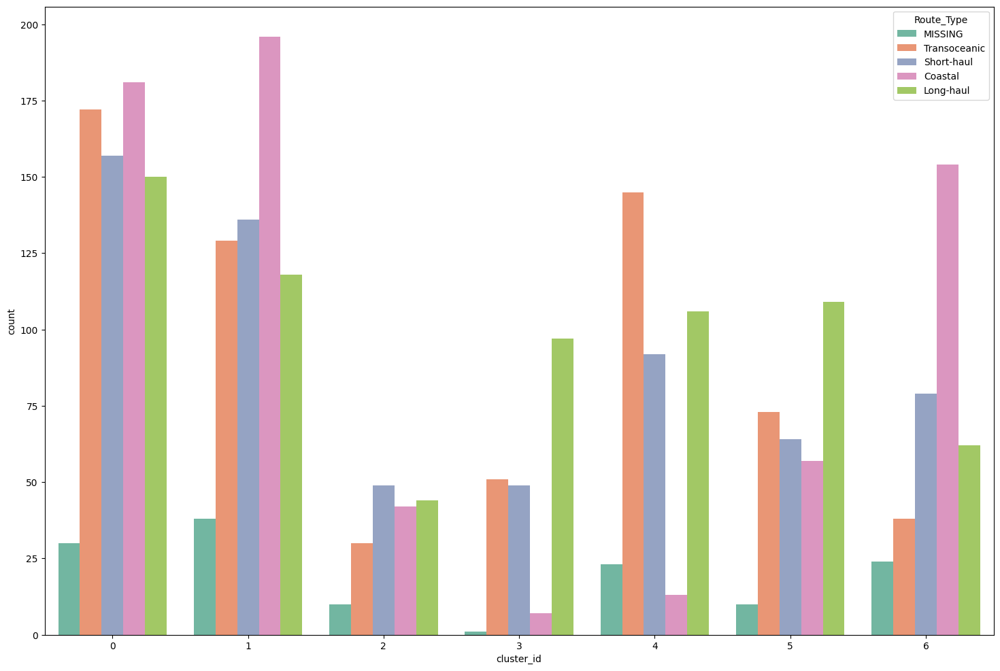

In [310]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_agglomerative_df,
    x='cluster_id',
    hue='Route_Type',
    palette='Set2'
)
plt.legend(title='Route_Type', loc='upper right')
plt.show()

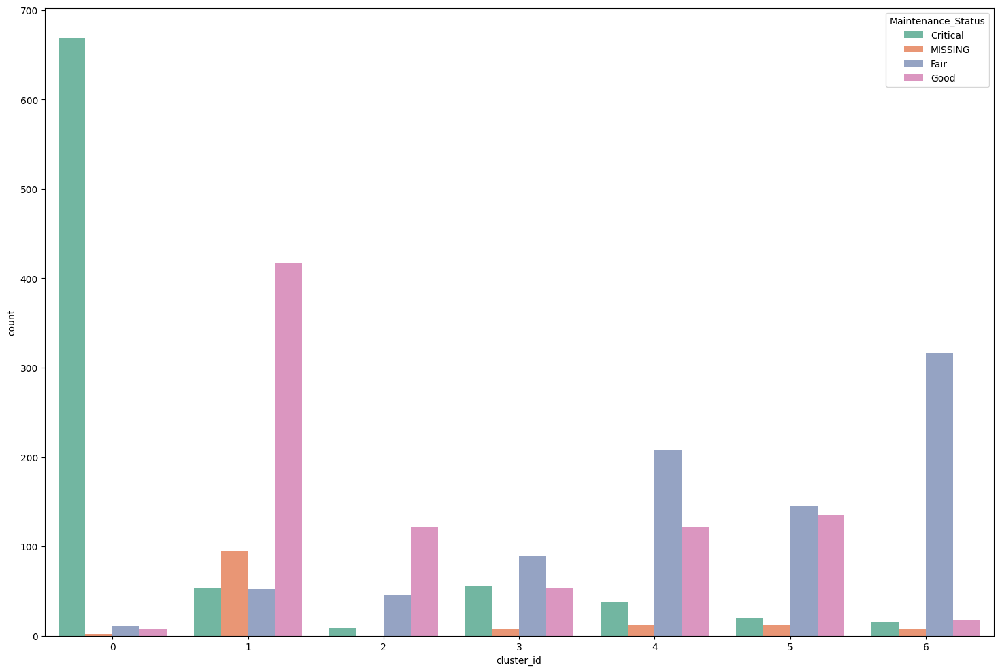

In [311]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_agglomerative_df,
    x='cluster_id',
    hue='Maintenance_Status',
    palette='Set2'
)
plt.legend(title='Maintenance_Status', loc='upper right')
plt.show()

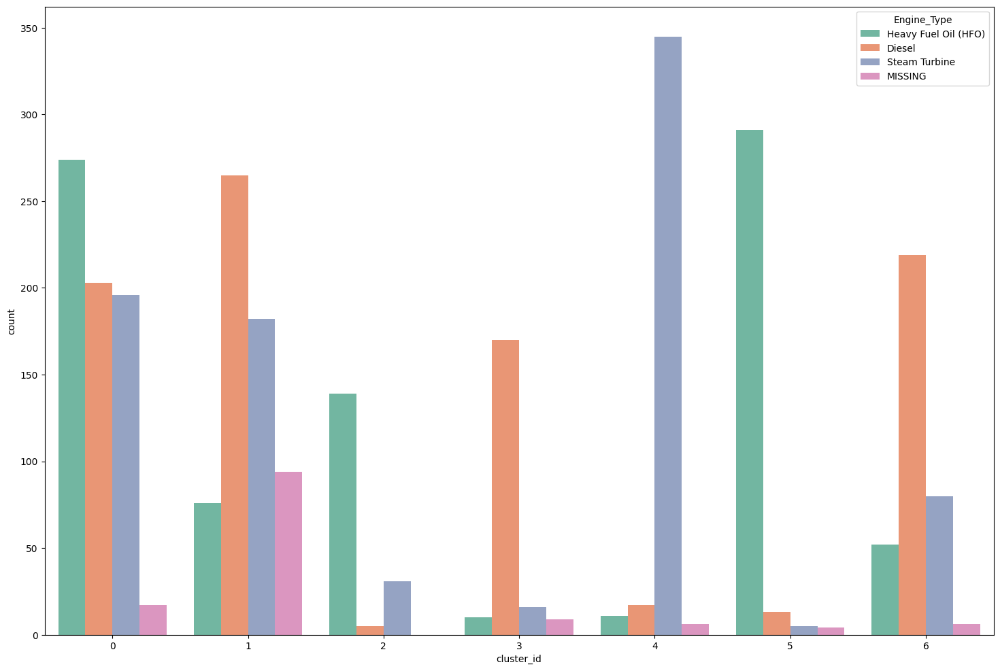

In [312]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_agglomerative_df,
    x='cluster_id',
    hue='Engine_Type',
    palette='Set2'
)
plt.legend(title='Engine_Type', loc='upper right')
plt.show()

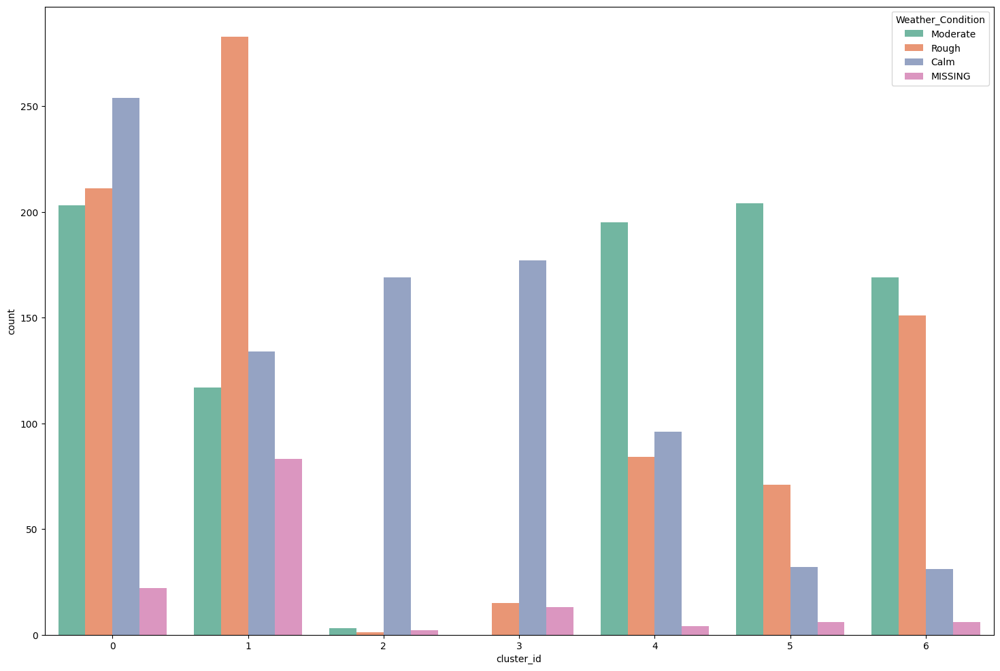

In [313]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_agglomerative_df,
    x='cluster_id',
    hue='Weather_Condition',
    palette='Set2'
)
plt.legend(title='Weather_Condition', loc='upper right')
plt.show()

In [314]:
def plot_my_graphs_agglomerative(name_of_column, name_of_graph=None):
    name = name_of_column
    
    if name_of_graph is not None:
        name2 = name_of_graph
    else:
        name2 = name

    
    plt.figure(figsize=(15, 5))
    plt.suptitle(name2.upper(), fontsize=16)

    plt.subplot(1, 3, 1) 
    sns.boxplot(data=X_agglomerative_df, y=name, x='cluster_id')
    plt.yscale('log')
    plt.title("Boxplot")

    plt.subplot(1, 3, 2)  
    sns.scatterplot(data=X_agglomerative_df, x='cluster_id', y=name)
    plt.title("Scatter Plot")

    plt.subplot(1, 3, 3)  
    sns.violinplot(data=X_agglomerative_df, x='cluster_id', y=name)
    plt.title("Violin Plot")

    plt.tight_layout() 
    plt.show()

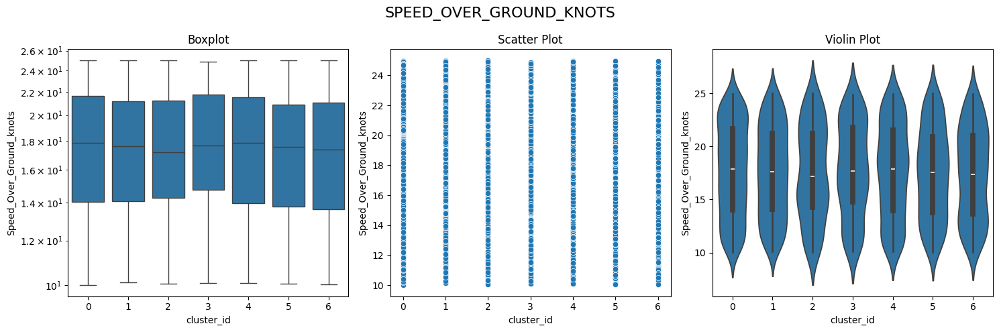

In [315]:
plot_my_graphs_agglomerative("Speed_Over_Ground_knots")

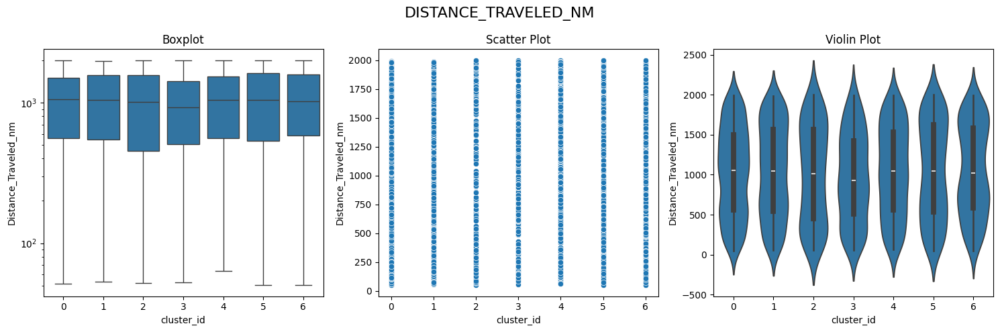

In [317]:
plot_my_graphs_agglomerative("Distance_Traveled_nm")

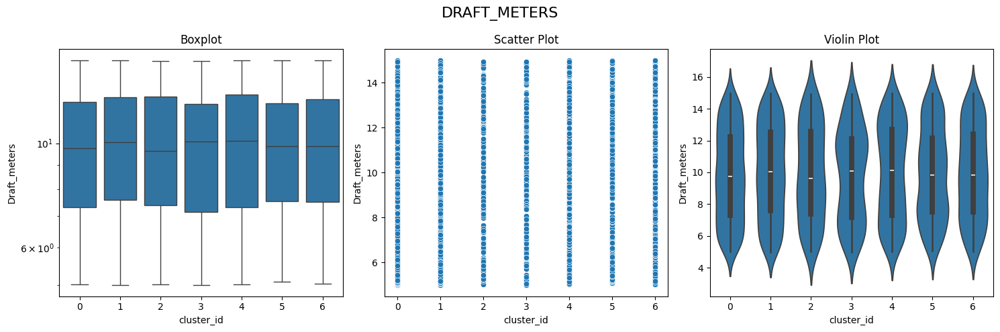

In [318]:
plot_my_graphs_agglomerative("Draft_meters")

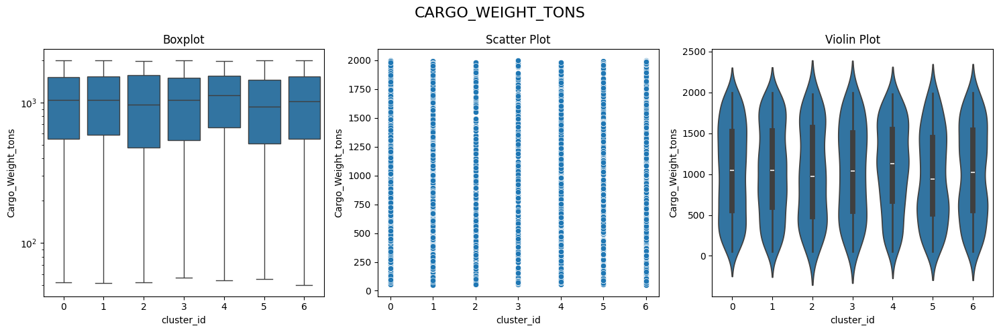

In [319]:
plot_my_graphs_agglomerative("Cargo_Weight_tons")

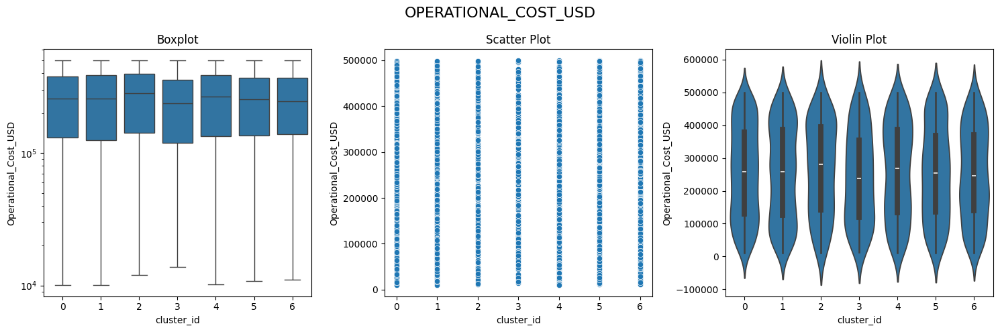

In [320]:
plot_my_graphs_agglomerative("Operational_Cost_USD")

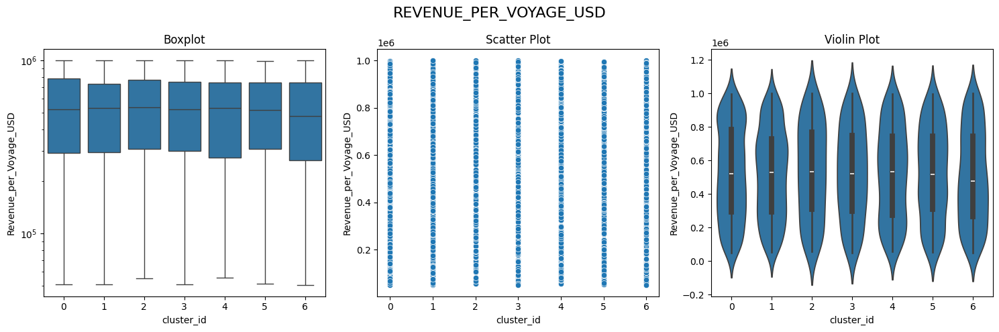

In [322]:
plot_my_graphs_agglomerative("Revenue_per_Voyage_USD")

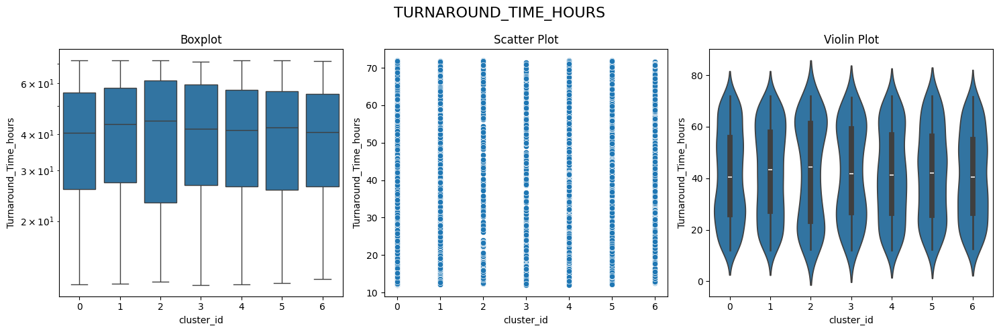

In [323]:
plot_my_graphs_agglomerative("Turnaround_Time_hours")

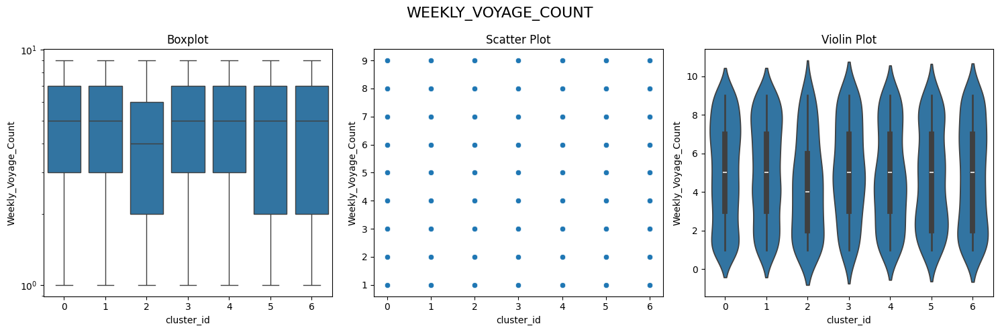

In [324]:
plot_my_graphs_agglomerative("Weekly_Voyage_Count")


Pomocí dendrogramu jsem vybral vzdálenost 18, která mi utvořila 7 klastrů. Když jsem si je vizualizoval pomocí t SNE, tak jde vidět, že jednotlové klastry jsou od sebe nejsou dobře separovány. 

Nejpočetnější je klastr jedna a dva, který má pod 700 a nad 600 lodí. U typů lodí jsou klastry uspořádaný různě, ale nevidím v tom nic podstatného. U druhů cest v druhém a sedmém klastru převažují pobřežní trasy, u čtvrtého a šestého dálkové trasy a u pátého zaoceánské trasy.
Co se týče stavu plavidla, tak první klastr je v kritickém stavu, druhý a třetí v dobrém stavu, čtyři, pět a sedm v přijatelném a šestý v přijatelném a dobrém stavu. 
V pátém klastru dominuje parní rutbína, v druhém čtvrtém a sedmém klastru převažuje diesel a v prvním, třetím a šestém zase motor na těžký topný olej.
První klast je kombinací všech počasí, druhý je převážné drsné počasí, třetí a čtvrtý je klidné počasí a pět, šest a sedm je mírné počasí.
U číselných atributú opět nevidíme žádné zajímavé rozdíly mezi klastry.

Shrnutí klastrů, které jsem našel pomocí aglomerativního shlukování je následující: <br>
První klastr je poměrně velký (přibližně 700 lodí) a tvoří jej plavidla v kritickém stavu, která využívají motor na těžký topný olej. Lodě v tomto klastru pluly ve všech typech počasí, což naznačuje, že podmínky nebyly rozhodujícím faktorem při jejich zařazení.
Druhý klastr má kolem 600 lodí a zahrnuje plavidla v dobrém technickém stavu, poháněná převážně dieselovým motorem, která nejčastěji plula v drsném počasí.
Třetí klastr je menší a tvoří jej lodě také v dobrém stavu, se stejným typem pohonu (těžký topný olej), ale vyskytovaly se u nich převážně klidné podmínky na moři.
Čtvrtý klastr zahrnuje lodě v přijatelném stavu, většinou s dieselovým pohonem, které se pohybovaly hlavně na dálkových trasách a často zažily klidné počasí.
Pátý klastr je početně menší, ale specifický — převládají zde lodě se zaoceánskými trasami a poháněné parní turbínou. Tyto lodě jsou převážně v přijatelném stavu a čelily mírnému počasí.
Šestý klastr tvoří kombinaci lodí v přijatelném a dobrém stavu, které využívají motor na těžký topný olej. Také zde převažovalo mírné počasí.
Sedmý klastr uzavírá celé rozdělení — jde o lodě v přijatelném stavu, poháněné převážně dieselovým motorem, které se pohybovaly na pobřežních trasách a měly také mírné počasí během plavby.

Celkově lze říct, že aglomerativní shlukování odhalilo více jemných rozdílů než K-Means, ale hranice mezi klastry nejsou jednoznačně oddělené. Klastry se často překrývají a sdílejí podobné vlastnosti, zejména v technickém stavu a typu pohonu. Hlavní odlišnosti se objevují u kombinací stavu lodi, typu trasy a převládajícího počasí, které dohromady vytvářejí různé profily lodí s podobnými provozními charakteristikami.


### DB Scan

In [109]:
X_dbscan = copy.deepcopy(df_encoded)
X_dbscan_df = df

In [257]:
from sklearn.metrics import silhouette_score

eps_values = np.arange(0.3, 2.0, 0.1)
min_samples_values = [i for i in range(3, 10 ,1)]

best_score = -1
best_params = None

for eps in eps_values:
    for min_samples in min_samples_values:
        labels = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(X_dbscan)
        if len(set(labels)) > 1:
            score = silhouette_score(X_dbscan, labels)
            #print(f"eps={eps}, min_samples={min_samples}, silhouette={score:.3f}")
            if score > best_score:
                best_score = score
                best_params = (eps, min_samples)

print("Nejlepší parametry:", best_params)

Nejlepší parametry: (np.float64(1.9000000000000006), 3)


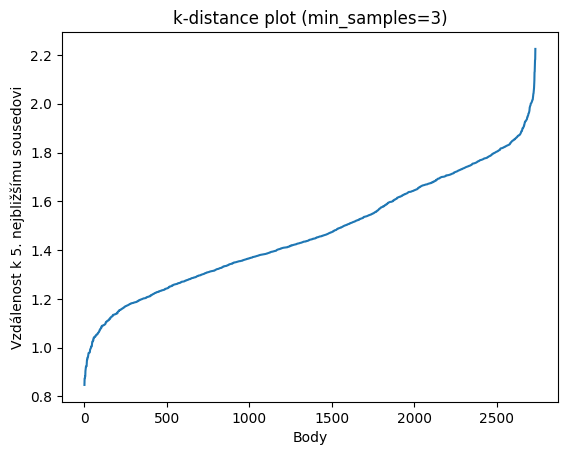

In [259]:
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors=3)
nbrs = neigh.fit(X_dbscan)
distances, indices = nbrs.kneighbors(X_dbscan)

distances = np.sort(distances[:,2])
plt.plot(distances)
plt.title("k-distance plot (min_samples=3)")
plt.xlabel("Body")
plt.ylabel("Vzdálenost k 5. nejbližšímu sousedovi")
plt.show()

In [326]:
dbscan = DBSCAN(eps=1.8, min_samples=3, metric='euclidean')
labels = dbscan.fit_predict(X_dbscan)

In [264]:
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)
n_count = len(labels)

print(f"Počet shluků: {n_clusters}")
print(f"Počet šumových bodů: {n_noise}")
print(f"Počet bodů: {n_count}")

Počet shluků: 2
Počet šumových bodů: 106
Počet bodů: 2736


In [265]:
tsneX_dbscan = TSNE(n_components=2, perplexity=30, random_state=13)
X_tsneX_dbscan = tsneX_dbscan.fit_transform(X_dbscan)

/var/folders/_r/b5yd1jqj5dg8_q46vf_wrsgr0000gn/T/ipykernel_3470/984776791.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = ListedColormap(plt.cm.get_cmap('tab20', k)(np.arange(k)))


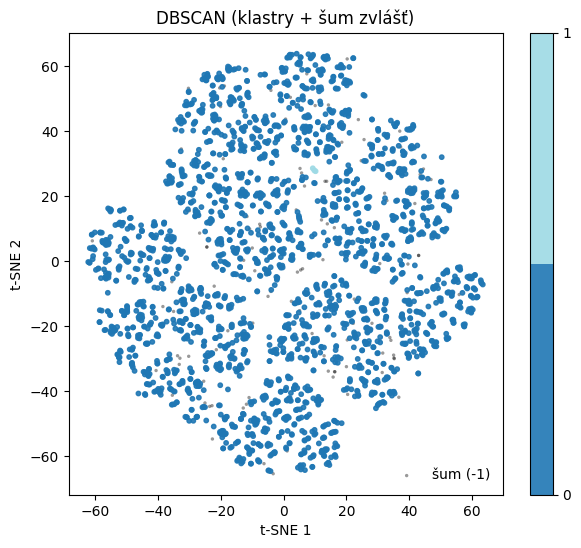

In [266]:
from matplotlib.colors import ListedColormap


labels = np.asarray(labels)
mask_noise = labels == -1
mask_core  = ~mask_noise
core_labels = np.unique(labels[mask_core])
k = len(core_labels)

# paleta jen pro klastry
cmap = ListedColormap(plt.cm.get_cmap('tab20', k)(np.arange(k)))
label_to_idx = {lab: i for i, lab in enumerate(core_labels)}
c_core = np.vectorize(label_to_idx.get)(labels[mask_core])

plt.figure(figsize=(7,6))

# 1) šum jako podklad
plt.scatter(X_tsneX_dbscan[mask_noise,0], X_tsneX_dbscan[mask_noise,1],
            c='black', s=6, alpha=0.4, edgecolors='none', label='šum (-1)')

# 2) klastry nad tím
sc = plt.scatter(X_tsneX_dbscan[mask_core,0], X_tsneX_dbscan[mask_core,1],
                 c=c_core, cmap=cmap, s=10, alpha=0.9)

plt.xlabel("t-SNE 1"); plt.ylabel("t-SNE 2")
plt.title("DBSCAN (klastry + šum zvlášť)")

# colorbar jen pro klastry
ticks = np.arange(k)
cb = plt.colorbar(sc, ticks=ticks)
cb.ax.set_yticklabels([str(l) for l in core_labels])

# volitelně legenda pro šum
plt.legend(loc='lower right', frameon=False)
plt.show()

In [327]:
X_dbscan_df['cluster_id'] = labels

<Axes: xlabel='cluster_id', ylabel='count'>

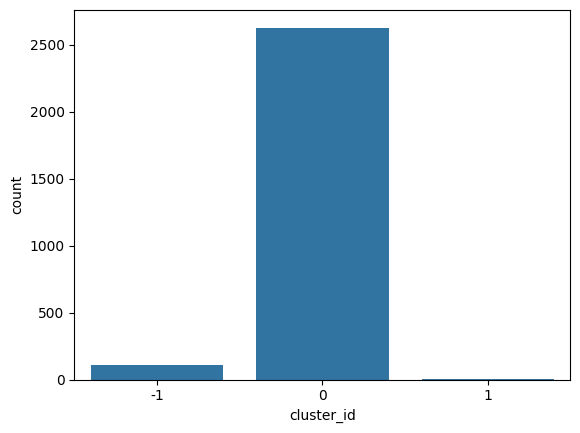

In [328]:
sns.countplot(data=X_dbscan_df, x='cluster_id')

U DB Scan jsem nebyl schopen najít smysluplné clustery.

### Spectral Clustering

Jelikož jsem nebyl schopen DB Scanem zjistit žádné zajímavé klastry, tak použiju ještě Spectral clustering.

In [25]:
X_spectral = df_encoded
X_spectral_df = df

In [27]:
import sklearn

In [33]:
clustering_spectral_scores = []
for k in range(2, 11):
    clustering = sklearn.cluster.SpectralClustering(
        n_clusters=k,
        affinity="rbf", 
        assign_labels="kmeans", 
        random_state=13
    ).fit(X_spectral)
    clustering_spectral_scores.append({
        'k': k,
        'silhouette': sklearn.metrics.silhouette_score(X_spectral, clustering.labels_)
    })
df_clustering_spectral_scores = pd.DataFrame.from_dict(clustering_spectral_scores, orient='columns')
df_clustering_spectral_scores = df_clustering_spectral_scores.set_index('k')


<Axes: xlabel='k', ylabel='silhouette'>

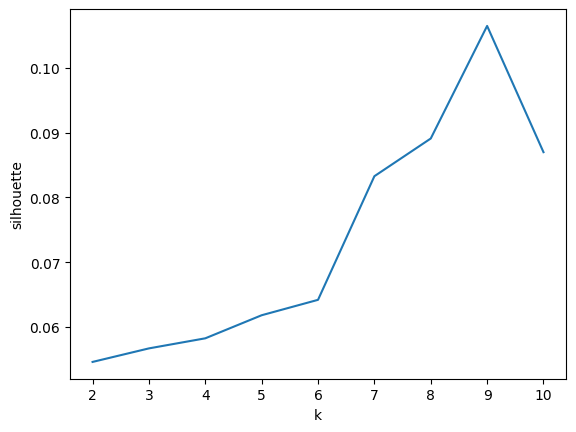

In [34]:
sns.lineplot(data = df_clustering_spectral_scores, y='silhouette', x='k')

Dle siluety jasně vidíme, že nejoptimálnější bude hledat 9 klastrů.

In [36]:
spectral = sklearn.cluster.SpectralClustering(
    n_clusters=9,
    affinity="rbf",
    assign_labels="kmeans",
    random_state=13
)

labels = spectral.fit_predict(X_spectral)

In [37]:
pd.Series(spectral.labels_).value_counts()

6    347
3    338
2    317
1    301
0    300
5    293
8    289
7    276
4    275
Name: count, dtype: int64

In [38]:
X_spectral['cluster_id'] = spectral.labels_
X_spectral.head()

,Ship_Type_Bulk Carrier,Ship_Type_Container Ship,Ship_Type_Fish Carrier,Ship_Type_Tanker,Route_Type_Coastal,Route_Type_Long-haul,Route_Type_Short-haul,Route_Type_Transoceanic,Engine_Type_Diesel,Engine_Type_Heavy Fuel Oil (HFO),...,Draft_meters,Efficiency_nm_per_kWh,Engine_Power_kW,Operational_Cost_USD,Revenue_per_Voyage_USD,Seasonal_Impact_Score,Speed_Over_Ground_knots,Turnaround_Time_hours,Weekly_Voyage_Count,cluster_id
0,False,True,False,False,False,False,False,False,False,True,...,0.913856,0.968493,0.625357,0.967522,0.254676,0.916364,0.172666,0.230969,0.000,8
1,False,False,True,False,False,False,True,False,False,False,...,0.965983,0.135914,0.518488,0.966615,0.877680,0.385945,0.025210,0.854481,0.625,1
2,False,True,False,False,False,True,False,False,True,False,...,0.219929,0.285468,0.459434,0.895451,0.361920,0.906517,0.716607,0.623798,1.000,3
3,True,False,False,False,False,False,False,True,False,False,...,0.679323,0.430789,0.165847,0.513144,0.039175,0.871380,0.736981,0.173291,0.000,2
4,False,False,True,False,False,False,False,True,True,False,...,0.473014,0.879978,0.235695,0.566997,0.659007,0.083444,0.249079,0.869660,0.875,3


In [41]:
tsne_spectral = TSNE(n_components=2, perplexity=30, random_state=13)
X_tsne_spectral = tsne_spectral.fit_transform(X_spectral)

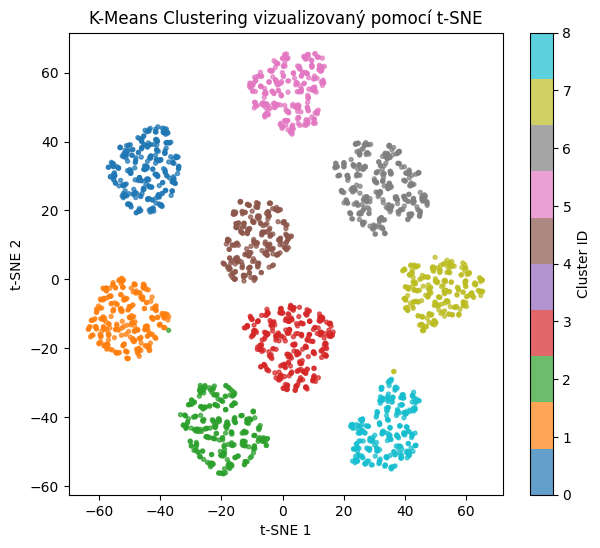

In [42]:
plt.figure(figsize=(7,6))
plt.scatter(X_tsne_spectral[:, 0], X_tsne_spectral[:, 1], c=X_spectral['cluster_id'], cmap='tab10', s=8, alpha=0.7)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.title("K-Means Clustering vizualizovaný pomocí t-SNE")
plt.colorbar(label="Cluster ID")
plt.show()

In [43]:
X_spectral_df['cluster_id'] = spectral.labels_

<Axes: xlabel='cluster_id', ylabel='count'>

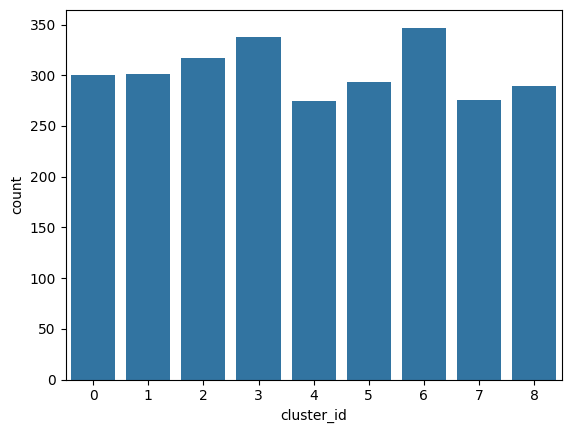

In [44]:
sns.countplot(data=X_spectral_df, x='cluster_id')

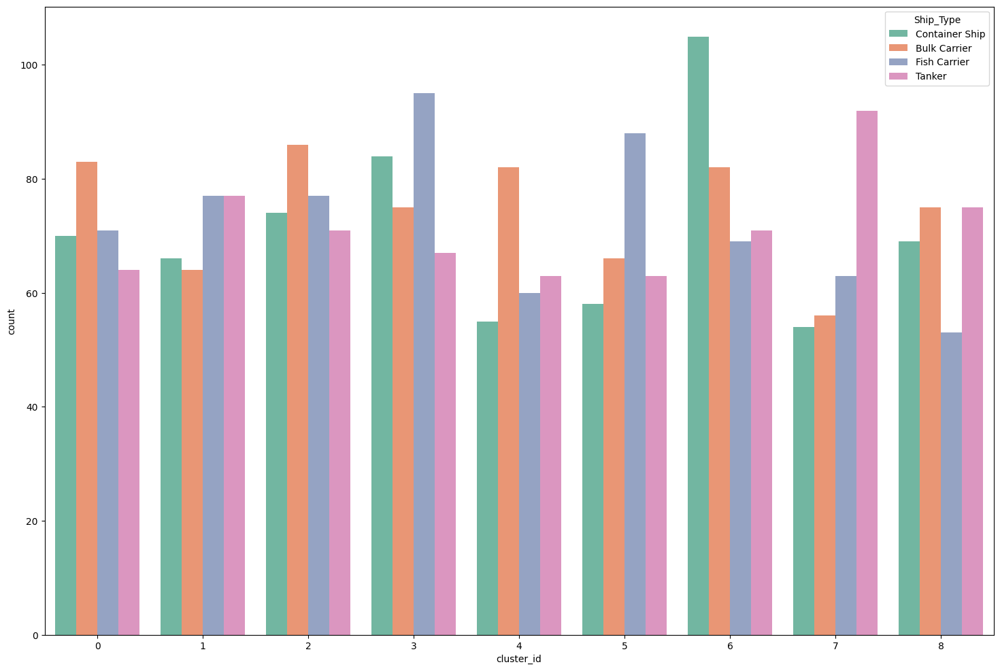

In [45]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_spectral_df,
    x='cluster_id',
    hue='Ship_Type',
    palette='Set2'
)
plt.legend(title='Ship_Type', loc='upper right')
plt.show()

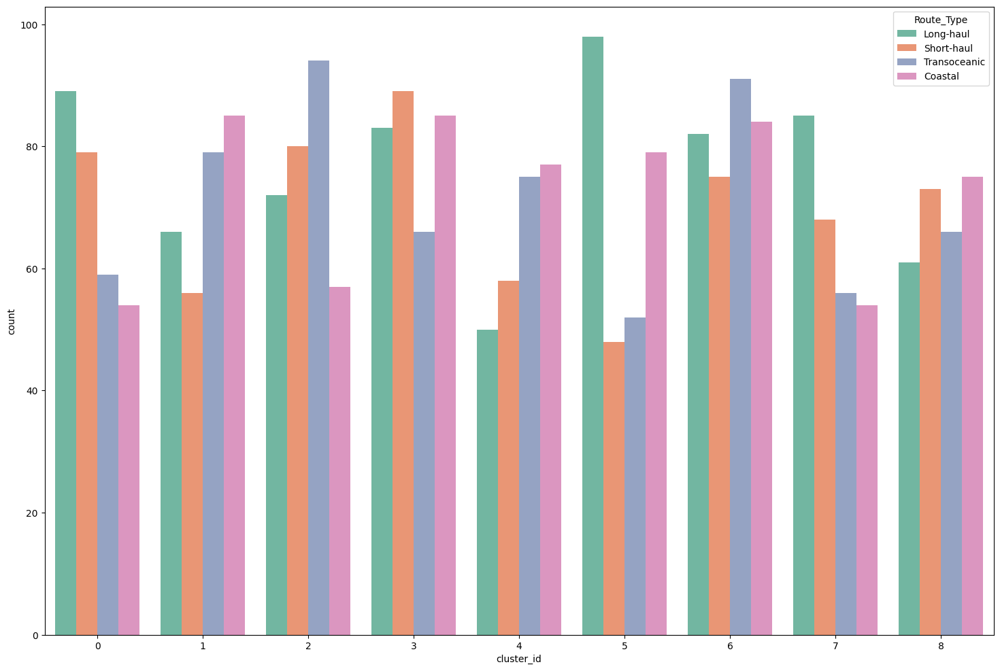

In [46]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_spectral_df,
    x='cluster_id',
    hue='Route_Type',
    palette='Set2'
)
plt.legend(title='Route_Type', loc='upper right')
plt.show()

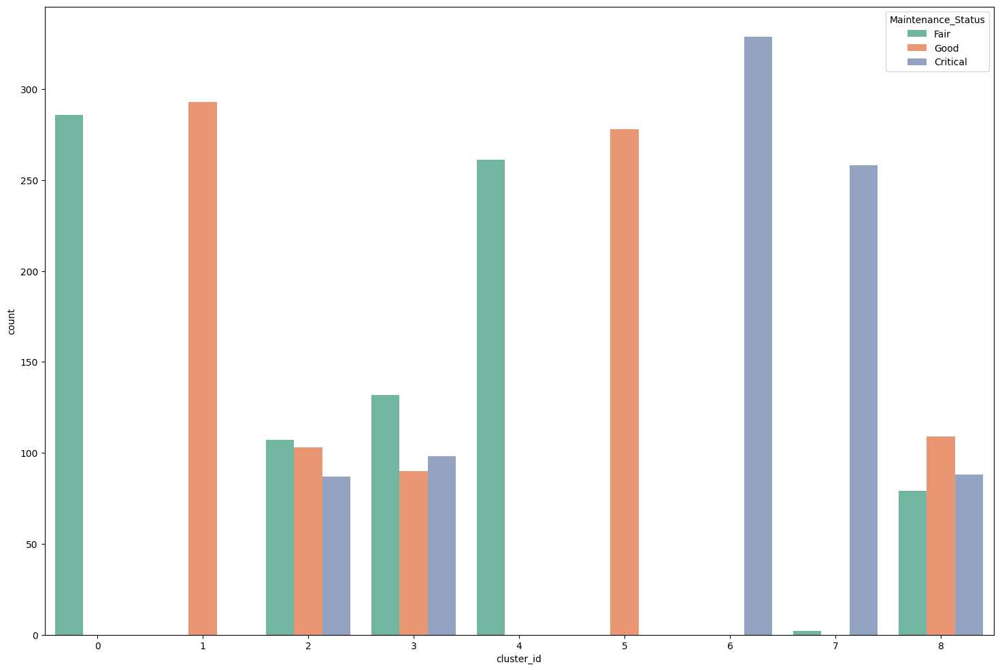

In [48]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_spectral_df,
    x='cluster_id',
    hue='Maintenance_Status',
    palette='Set2'
)
plt.legend(title='Maintenance_Status', loc='upper right')
plt.show()

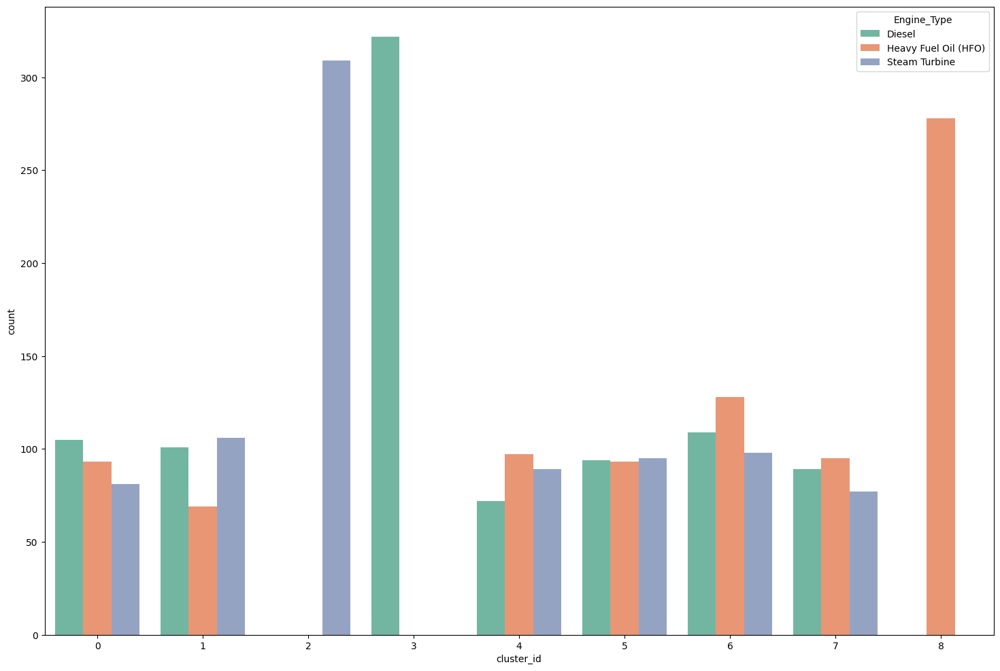

In [49]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_spectral_df,
    x='cluster_id',
    hue='Engine_Type',
    palette='Set2'
)
plt.legend(title='Engine_Type', loc='upper right')
plt.show()

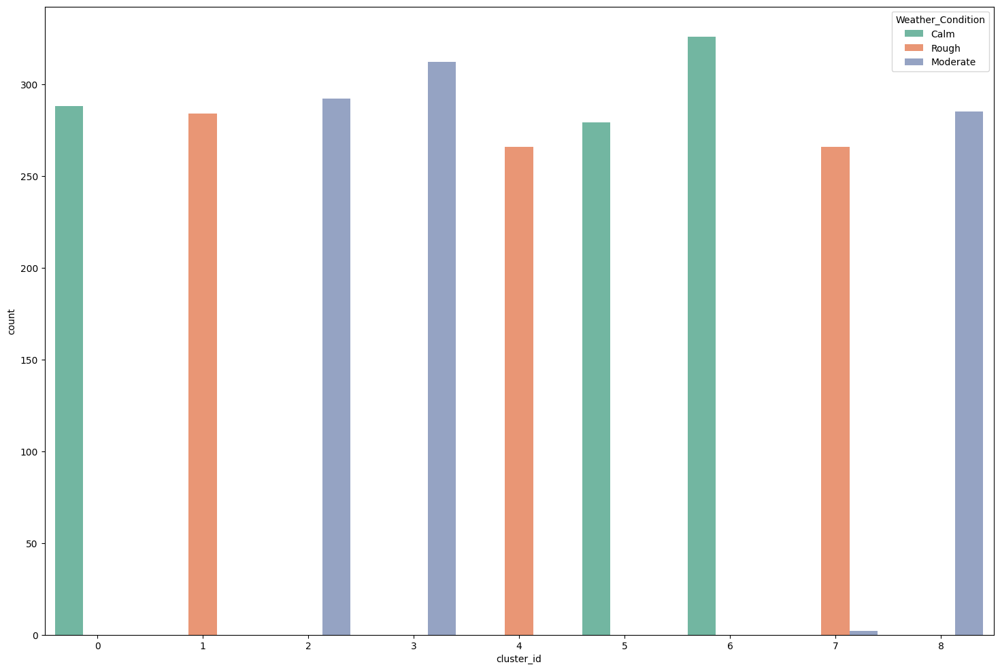

In [50]:
plt.figure(figsize=(18, 12))
sns.countplot(
    data=X_spectral_df,
    x='cluster_id',
    hue='Weather_Condition',
    palette='Set2'
)
plt.legend(title='Weather_Condition', loc='upper right')
plt.show()

In [53]:
def plot_my_graphs_data(name_of_column, data, name_of_graph=None):
    name = name_of_column
    
    if name_of_graph is not None:
        name2 = name_of_graph
    else:
        name2 = name

    
    plt.figure(figsize=(15, 5))
    plt.suptitle(name2.upper(), fontsize=16)

    plt.subplot(1, 3, 1) 
    sns.boxplot(data=data, y=name, x='cluster_id')
    plt.yscale('log')
    plt.title("Boxplot")

    plt.subplot(1, 3, 2)  
    sns.scatterplot(data=data, x='cluster_id', y=name)
    plt.title("Scatter Plot")

    plt.subplot(1, 3, 3)  
    sns.violinplot(data=data, x='cluster_id', y=name)
    plt.title("Violin Plot")

    plt.tight_layout() 
    plt.show()

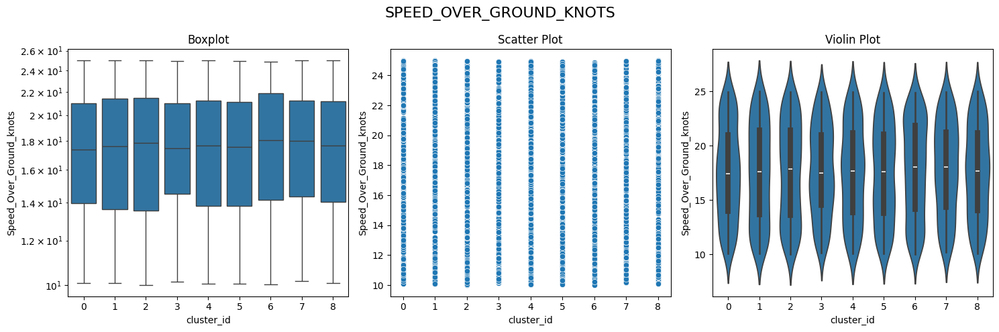

In [54]:
plot_my_graphs_data("Speed_Over_Ground_knots", X_spectral_df)

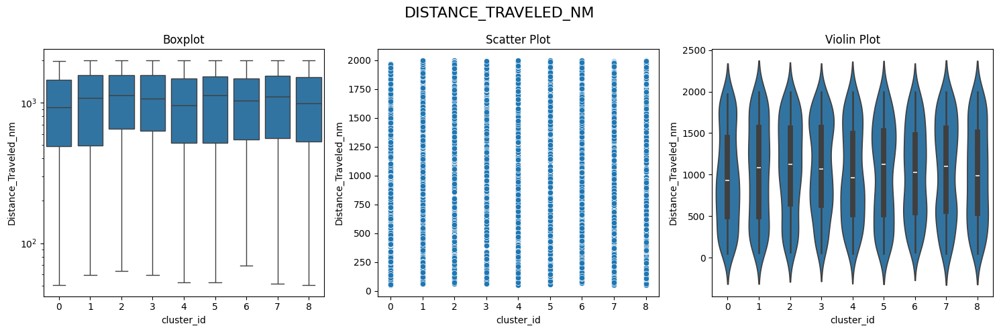

In [55]:
plot_my_graphs_data("Distance_Traveled_nm", X_spectral_df)

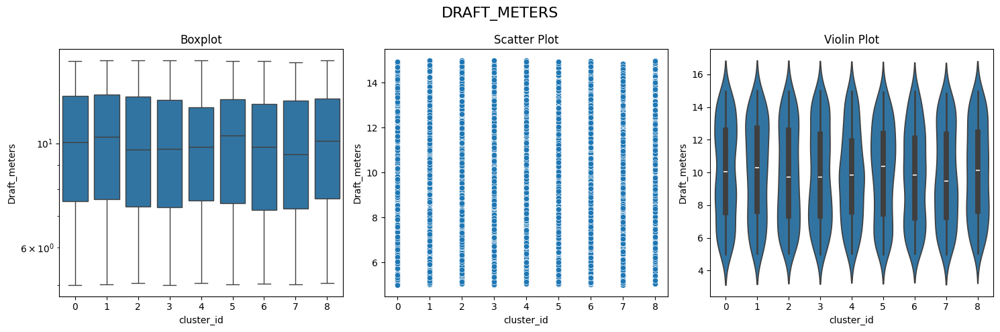

In [56]:
plot_my_graphs_data("Draft_meters", X_spectral_df)

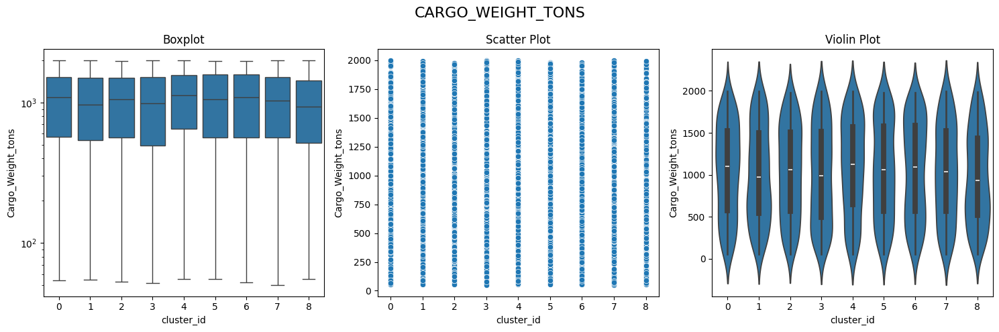

In [58]:
plot_my_graphs_data("Cargo_Weight_tons", X_spectral_df)

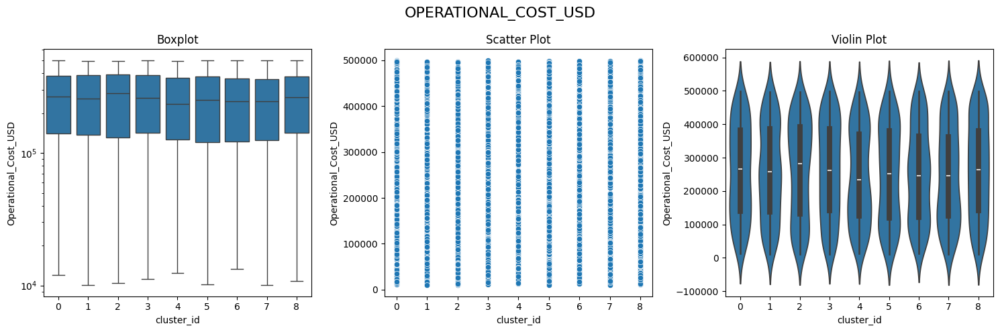

In [59]:
plot_my_graphs_data("Operational_Cost_USD", X_spectral_df)

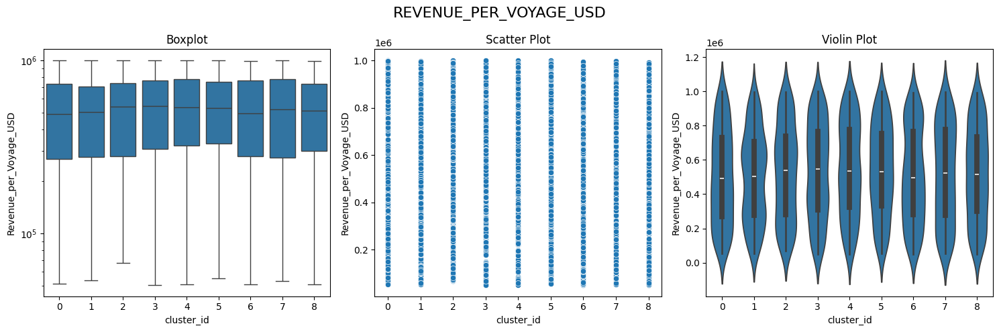

In [60]:
plot_my_graphs_data("Revenue_per_Voyage_USD", X_spectral_df)

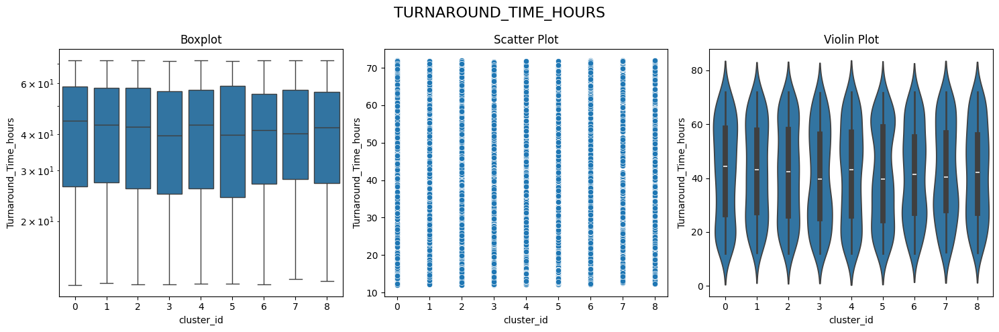

In [61]:
plot_my_graphs_data("Turnaround_Time_hours", X_spectral_df)

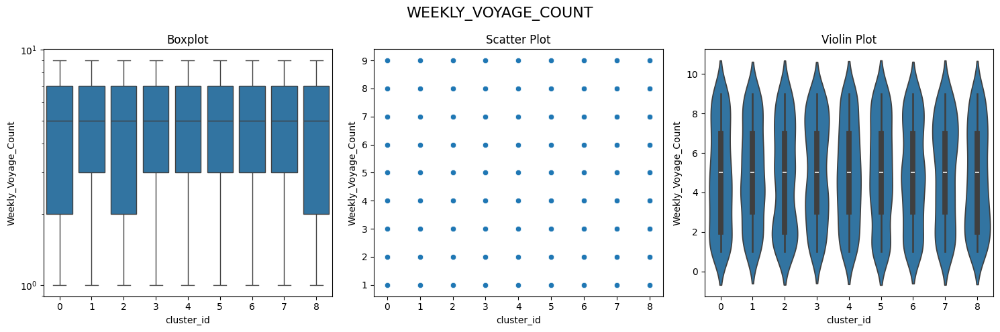

In [62]:
plot_my_graphs_data("Weekly_Voyage_Count", X_spectral_df)

Jelikož tuto metodu dodělávám později, rozhodl jsme se, že pro usnadnění budu používat i klastr 0, aby čísla klastrů v textu seděla s čísly klastrů v grafech.

Dle siluety jsem si nastavil 9 klastrů. Dle TSNE vizualizace můžeme vidět, že jsou jasně separované.

U číselných grafů se znova neukázaly žádné postatné rozdíly. 

U kategorických grafů tp nylo mnohem lepší a u třech jsou jasné rozdíly podle klastrů.

Všechny klastry jsou podobně velké, kolem 300 lodí. Všechny klastry jsou tvořeny všemi typy lodí. Nejvíce vyčnívají klastry 6 a 7, kde u jednoho dominují kontejnerové lodě a u druhého tankery. U stavu lodi jsou klastry velice odlišné. Kalstr 0 a 4 tvoří pouze lodě v přijatelném stavu. Klastr 1 a 5 tvoří lodě v dobrém stavu. Klastr 6 a 7 tvoří lodě v kritickém stavu. Klastry 2, 3 a 8 jsou tvořeny kombinací všech tří stavů. u druhu motoru je klast 8 tvořen pouze loděmi na těžký topný olej, klastr 2 loděmi s praní turbínou a klastr 3 naftovými loděmi. Klastry 0, 1, 4, 5, 6 a 7 jsou tvořeny kombinacemi všech typů pohonu. U typu počasí máme téměř dokonalé rozdělení. Klastry 0, 5 a 6 měly klidné počasí. Klastry 1, 4 a 7 měly drsné počasí. Klastry 2, 3 a 8 měly mírné počasí.

Shrnutí klastrů:<br>

Klastr 0<br>
Tento klastr je tvořen loděmi, které jsou výhradně v přijatelném technickém stavu. Plavidla využívají různé typy pohonu a nejsou výrazně vyhraněná podle typu lodi. Pro tento klastr je typické klidné počasí během plavby.<br>

Klastr 1<br>
Klastr obsahuje lodě v dobrém technickém stavu, které kombinují všechny typy pohonů. Nevynikají žádným konkrétním typem plavidla, ale výrazně se odlišují drsným počasím, kterému byly vystaveny.<br>

Klastr 2<br>
Tento klastr je jeden z nejzajímavějších díky jednoznačnému profilu: lodě jsou poháněny výhradně parní turbínou. Stav lodí je smíšený (kritické, dobré i přijatelné), typově pestré. Pro plavby v tomto klastru je typické mírné počasí.<br>

Klastr 3<br>
Do tohoto klastru spadají lodě poháněné čistě naftovými motory. Stejně jako u klastru 2 je i zde kombinace lodí všech stavů. Plavidla se pohybovala převážně v mírném počasí.<br>

Klastr 4<br>
Klastr 4 zahrnuje pouze lodě v přijatelném stavu, podobně jako klastr 0. Využívají různé typy pohonu a typy plavidel. Zásadním rozlišovacím faktorem je zde drsné počasí, které lodě potkalo během plavby.<br>

Klastr 5<br>
Tento klastr je tvořen loděmi v dobrém technickém stavu. Typy lodí i pohonů jsou smíšené. Charakterizuje jej klidné počasí, které převažovalo během jejich tras.<br>

Klastr 6<br>
Jedná se o klastr lodí v kritickém technickém stavu, přičemž plavidla využívají různé typy pohonu. Klastr je charakteristický především klidným počasím, což jej odlišuje od ostatních kritických klastrů.<br>

Klastr 7<br>
Tento klastr rovněž zahrnuje plavidla v kritickém stavu, ale na rozdíl od klastru 6 zde dominují tankery. Lodě využívají směs typů pohonu, ale výrazným znakem je drsné počasí.<br>

Klastr 8<br>
voří ho lodě poháněné výhradně těžkým topným olejem. Lodě jsou zastoupeny ve všech stavech. Pro tento klastr je charakteristické mírné počasí při plavbě.<br>


